# Introduction
---

Dear Roy and Shaul,

I tidy this notebook to contain all the steps necessary to create all the data I gathered to make the same results to some degree (There are probably some models that I forgot to set the random_state for). 

Through the entire time of working the project I had to do some shady steps in the codes of others to make certain things to work properly and get all the information, so I want to apologize in advance that some code pieces are old enough to never work the same way they worked in the past. Though I will do my best to let you have the option to gather the entire data that I gathered (which sums up to over 50GB).

Also there are some codes through the project that I didn't manage to use or get any information from, so there won't be any mentions in the final report about them (for example, I tried to use ColumnTransformer combining RBFSampler/PolynomialFeatures to process the data to match a Random Forest better or the fact that I did have a good look on the spread of the features I was using at the beginning)

## Packages used through the project
---

In [6]:
# File System Packages
import sys, os
import pickle as pkl

from typing import Optional, Union, Any, List, Dict

# Website APIs Packages
import requests

import tracemalloc
import asyncio
from shazamio import Shazam
%autoawait asyncio

# Math Packages
import numpy as np
import random

# Graphic and Plotting Packages
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import ticker
%matplotlib inline

# Data Science Packages
import pandas as pd
import simplejson as json
import re

## Preprocessing
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import metrics

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.kernel_approximation import RBFSampler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SequentialFeatureSelector

# Machine Learning Models: 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV

## Decision Trees
from sklearn.tree import DecisionTreeClassifier, plot_tree

## Random Forests
from sklearn.ensemble import RandomForestClassifier

## Neural Networks
import tensorflow as tf
from tensorflow import keras
from keras.layers import Input, Dense, Dropout, BatchNormalization, LSTM, Bidirectional

## NLP
from nrclex import NRCLex

# Data Gathering
---

The first part gather all the functions and codes that gathered, processed and extracted all the data later used to let the model learn to.

## Gathering Data from Shazam API
---
I had a lot of problems running this package, but that all I knew back then and I had to deal with it in ways I wish I could avoid, some of them were actually debugging inner code parts inside the shazamio package itself. It wasn't always working and as I mentioned in the report, I had lots of errors during the runs, ending with only 75% of what I started with, when I worked on the GTZAN original files.

The dataset can be found here: [GTZAN Original Dataset](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification)

This dataset and its root (`Data\\...`) should be located under `.misc\\original_gtzan_dataset\\`.

Take into consideration that the code below didn't work, due to unknown reasons connected to the asyncio package. `identify_songs.py` has the following blocks and is able to run. (Just double click and let it run in the same start point of the folder) tho I recommend you just use the csv I used to make the rest of the dataset. This is due to the possible that shazam made changes in their algorithm and it might lead to different results in the recognition of songs.

In [3]:
# ================ First Step: Song Recognition ================ #
async def create_song_recognition_generator(filename: str):
    '''
    Create Shazam generator that will focus on identifying the song kept under the given filename
    :param filename: The path to the audio file
    :return: asynchronous shazam generator for given audio filename
    '''
    shazam = Shazam()
    result = await shazam.recognize_song(filename)
    return result

def identify_song(filename: str) -> Dict[str, str]:
    try:
        generator = create_song_recognition_generator(filename)
        generator_loop = asyncio.get_event_loop()

        start_timer = time.time()
        raw_info = generator_loop.run_until_complete(generator)
        finish_timer = time.time()

        song_info = {"filename": os.path.basename(filename), "track_name": raw_info["track"]["title"], "artists":raw_info["track"]["subtitle"], "calculation_time":finish_timer-start_timer, "raw_info":raw_info}

    except:
        song_info = {"filename": os.path.basename(filename), "track_name": None, "artists":None, "calculation_time":-1, "raw_info":None}

    return song_info

In [ ]:
# Identify Songs In Database
# --------------------------
# this AUDIO_FILE_DIRECTORY is changable and just depends on where you placed the initial dataset downloaded from Kaggle.com
AUDIO_FILES_DIRECTORY: str = os.path.join(os.getcwd(), ".misc\\original_gtzan_dataset\\Data\\genres_original")
    
songs_info: List[Dict[str, str]] = []

tracemalloc.start()

# Iterate over all of the audio files in the directory tree
for root, dirs, files in os.walk(AUDIO_FILES_DIRECTORY):
    for filename in files:
        if filename.endswith('.wav'):
            songs_info.append(identify_song(os.path.join(root, filename)))

tracemalloc.stop()

songs_df = pd.DataFrame(songs_info) # make sure to have a "datasets" folder in the same location of this notebook where I can store all the information at
songs_df.to_csv("dataset_csvs\\shazamio_filenames_songs.csv", index=False, encoding='utf-8')

## Downloading Data From Spotify API
---

Spotify actually upgraded its Web API platform on the 27.03.2023. They removed their online console where I got my authorization token to get the data with, so I had to improvise real quick for you to serve some sort of the same functionality, sorry in advance if it doesn't work properly.

Spotify token, although they say it has a lifespan of 1 hour, it seems to hold for less than that (but it could also be due to my rate of sending queries that made them to think I was a robot and block the current authorization token). Anyway sorry in advance if there is some faulty communications with the packages

In [ ]:
SPOTIFY_CLIENT_ID = "your-client-id" # Given when making Spotify account
SPOTIFY_CLIENT_SECRET = "your-client-secret" 

In [13]:
def get_spotify_authentication_token(client_id: str, client_secret: str):
    my_headers = {"Content-Type": "application/x-www-form-urlencoded"}
    my_params = {"grant_type": "client_credentials", "client_id": client_id, "client_secret": client_secret}
    response = requests.post(f"https://accounts.spotify.com/api/token", headers=my_headers, params=my_params)
    if response.status_code == 200:
        return response.json()["access_token"]
    else:
        raise response

In [14]:
def search_spotify_track_id(track_name: str, artists: Optional[Union[str, List[str]]]):
    if isinstance(artists, list):
        for artist in artists:
            track_id = aux_search_spotify_track_id(track_name, artist)
            
            if track_id is not None:
                return track_id
            
        return None
    
    else:
        artist = artists
        return aux_search_spotify_track_id(track_name, artist)
    
def aux_search_spotify_track_id(track_name: str, artist: Optional[str]):
    query = f"track:{track_name} "
    if artist:
        query += f"artist:{artist}"
        
    my_headers = {"Authorization": f"Bearer {authentication_token}"}
    my_params = {"q": query, "type": "track"}
    response = requests.get(f"https://api.spotify.com/v1/search/", headers=my_headers, params=my_params)
    if response.status_code == 200:
        if response.json()["tracks"]["total"] == 0:
            return None
        return response.json()["tracks"]["items"][0]["id"]
    else:
        raise response

In [15]:
def get_spotify_track_info(track_id: str, authentication_token: str):
    my_headers = {f"Authorization": f"Bearer {authentication_token}"}
    response = requests.get(f"https://api.spotify.com/v1/tracks/{track_id}", headers=my_headers)
    if response.status_code == 200:
        return response.json()
    else:
        raise response

In [16]:
def get_spotify_audio_features(track_id: str, authentication_token: str):
    my_headers = {f"Authorization": f"Bearer {authentication_token}"}
    response = requests.get(f"https://api.spotify.com/v1/audio-features/{track_id}", headers=my_headers)
    if response.status_code == 200:
        return response.json()
    else:
        raise response

In [17]:
def get_spotify_audio_analysis(track_id: str, authentication_token: str):
    my_headers = {f"Authorization": f"Bearer {authentication_token}"}
    response = requests.get(f"https://api.spotify.com/v1/audio-analysis/{track_id}", headers=my_headers)
    if response.status_code == 200:
        return response.json()
    else:
        raise response

In [44]:
def download_spotify_track_data(track_id: str, root: str, access_token: str):
    track_id = str(track_id)
    local_track_folder = os.path.join(root, track_id)
    if not os.path.isdir(local_track_folder):
        os.mkdir(local_track_folder)
    
    track_info_filename = os.path.join(local_track_folder, "spotify_track_info.json")
    if not os.path.isfile(track_info_filename): # This to prevent unnecessary re-downloading files that already exists in the local folder
        track_info = get_spotify_track_info(track_id, access_token)
        with open(track_info_filename, 'w', encoding='utf-8') as outfile:
            json.dump(track_info, outfile, indent=4)
            
    audio_analysis_filename = os.path.join(local_track_folder, "spotify_audio_features.json")
    if not os.path.isfile(audio_analysis_filename): # This to prevent unnecessary re-downloading files that already exists in the local folder
        audio_analysis = get_spotify_audio_features(track_id, access_token)
        with open(audio_analysis_filename, 'w', encoding='utf-8') as outfile:
            json.dump(audio_analysis, outfile, indent=4)


    audio_features_filename = os.path.join(local_track_folder, "spotify_audio_analysis.json")
    if not os.path.isfile(audio_features_filename): # This to prevent unnecessary re-downloading files that already exists in the local folder
        audio_features = get_spotify_audio_analysis(track_id, access_token)
        with open(audio_features_filename, 'w', encoding='utf-8') as outfile:
            json.dump(audio_features, outfile, indent=4)

### GTZAN Original Dataset constructions
---
The following code block is specifically to make the final form of the first dataset I played with. There was no additional data downloaded and saved as JSON files, so it was enough as it is.
I hope the following code is working and if there are bugs is due to the fact the original code that I ran to make that dataset was a mess.

Again in any case, the final dataset I worked with later is in the dataset_csvs folder as well!

In [ ]:
# The next piece of code is specifically for the GTZAN Original Dataset as there are only track names and artists.
# There is a requirement for track_id in order to get the complete information for each track.

raw_dataset = pd.read_csv("dataset_csvs\\shazamio_filenames_songs.csv") # Load previously constructed dataset
dataset = raw_dataset[["filename", "track_name", "artists"]] # Remove raw_info column (it is usually a huge object data that contains everything... we don't really need it ATM)
dataset = dataset.dropna(subset=['track_name']) # Shazam not always succeed to identify the song and in the previous code we let these songs to go NaN, this time we remove those as well.

gtzan_tracks_features: List[Dict[str, Any]] = []

current_genre = ""
authentication_token = ""

for index, sample in dataset.iterrows():
    track_filename = sample["filename"]
    track_name = sample["track_name"]
    artists = sample["artists"]
    track_genre = track_filename.split('.')[0] # creating target column -> filename = "genre.number.wav"
    
    # The next procedure is to make sure there is always a valid authentication method, because sometimes it doesn't allow you to use the same token for long enough
    # this procedure has not been tested as for me I hadn't had the "priviledge" to ask for a token via API request and always found 
    # a valid token while working live with spotify console (which in the last update no longer generate you free valid tokens)
    # so forgive me if I didn't check it properly to work, this is really not the main part, and the prepared dataset is attached to the zip so you won't have to suffer as much as I did
    # trying running way worse looking code than the one presented here T_T
    if current_genre != track_genre:
        # At this point I only assumed that there will be no problem to update the token only when the code move to another genre.
        authentication_token = get_spotify_authentication_token(CLIENT_ID, CLIENT_SECRET)
    
    track_id = search_spotify_track_id(track_name, artists)

    if track_id is None:

        # Some songs that shazamio identified contained paranthesis and they were bugging the Spotify Web API to find the right song sometimes.
        # So if the song was failed to be found by the first try, check if it had paranthesis, remove them and run it again.
        if re.search(" *\(.*\)", track_name):
            track_name = re.sub(" *\(.*\)", '', track_name)

        # Another thing I noticed was that specifically for classical music, the music is kind of the same for song name, but there are many
        # executions of it, each with different orchestra and director, therefore it was obvious that Spotify will contain some versions
        # of the song, but not necessarily the same orchestra or director, so removing them from the search was ideal and turned out to be
        # super effective as it added about 30-50 songs to the list with features.
        if track_genre == 'classical':
            artists = None

        track_id = search_spotify_track_id(track_name, artists)
        
        if track_id is None:
            continue # Failed to find that song, then we move on to the next one, I did my best here... hey, I am not perfect...
            
    track_info = get_spotify_track_info(track_id, authentication_token)
    audio_features = get_spotify_audio_features(track_id, authentication_token)
    
    track_features: Dict[str, Any] = {}
    track_features["filename"]         = track_filename # either this feature is used as index
    track_features["track_id"]         = track_id # or this
    track_features["track_name"]       = track_name
    track_features["artists"]          = artists
    track_features["popularity"]       = track_info["popularity"]
    track_features["duration_ms"]      = track_info["duration_ms"]
    track_features["explicit"]         = track_info["explicit"]
    track_features["danceability"]    = audio_features["danceability"]
    track_features["energy"]           = audio_features["energy"]
    track_features["key"]              = audio_features["key"]
    track_features["loudness"]         = audio_features["loudness"]
    track_features["mode"]             = audio_features["mode"]
    track_features["speechiness"]      = audio_features["speechiness"]
    track_features["acousticness"]     = audio_features["acousticness"]
    track_features["instrumentalness"] = audio_features["instrumentalness"]
    track_features["liveness"]         = audio_features["liveness"]
    track_features["valence"]          = audio_features["valence"]
    track_features["tempo"]            = audio_features["tempo"]
    track_features["track_genre"]      = track_genre
    
    gtzan_tracks_features.append(track_features)
    
original_gtzan_df = pd.DataFrame(gtzan_tracks_features)
original_gtzan_df.to_csv("dataset_csvs\\gtzan_tracks_features.csv", index=False, encoding='utf-8')

### Spotify Tracks Additional files
---
The following code block was used to download all additional information used in this project (although I mostly used the `spotify_audio_analysis.json` file, I found interesting information in the other data I could download. For example, in the `spotify_track_info.json` file, there are links to album images and even sometimes a 30 seconds .WAV file to hear what the music is like)

The dataset can be found: [Spotify Track Dataset](https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset)

The additional files were NOT used for the first dataset, and that is why I didn't load in the next block the first dataset I worked with (where I find the best learning model to use)

In [8]:
# Load the dataset
spotify_tracks_dataset = pd.read_csv('dataset_csvs\\spotify_tracks_dataset.csv') # In kaggle.com it is originally called dataset.csv
print(spotify_tracks_dataset.track_genre.unique())

['acoustic' 'afrobeat' 'alt-rock' 'alternative' 'ambient' 'anime'
 'black-metal' 'bluegrass' 'blues' 'brazil' 'breakbeat' 'british'
 'cantopop' 'chicago-house' 'children' 'chill' 'classical' 'club' 'comedy'
 'country' 'dance' 'dancehall' 'death-metal' 'deep-house' 'detroit-techno'
 'disco' 'disney' 'drum-and-bass' 'dub' 'dubstep' 'edm' 'electro'
 'electronic' 'emo' 'folk' 'forro' 'french' 'funk' 'garage' 'german'
 'gospel' 'goth' 'grindcore' 'groove' 'grunge' 'guitar' 'happy'
 'hard-rock' 'hardcore' 'hardstyle' 'heavy-metal' 'hip-hop' 'honky-tonk'
 'house' 'idm' 'indian' 'indie-pop' 'indie' 'industrial' 'iranian'
 'j-dance' 'j-idol' 'j-pop' 'j-rock' 'jazz' 'k-pop' 'kids' 'latin'
 'latino' 'malay' 'mandopop' 'metal' 'metalcore' 'minimal-techno' 'mpb'
 'new-age' 'opera' 'pagode' 'party' 'piano' 'pop-film' 'pop' 'power-pop'
 'progressive-house' 'psych-rock' 'punk-rock' 'punk' 'r-n-b' 'reggae'
 'reggaeton' 'rock-n-roll' 'rock' 'rockabilly' 'romance' 'sad' 'salsa'
 'samba' 'sertanejo' 'show

In [9]:
# Take relevant genres to explore (There are just too many XD)
## Similar Genres to GTZAN Database: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification
gtzan_genres = ["blues", "classical", "country", "disco", "hip-hop", "jazz", "metal", "pop", "reggae", "rock"]
gtzan_dataset = spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(gtzan_genres)]

## TODO: Custom selection of genres to try on the models to learn and find out interesting connections:
# This dataset is later used to prove there is a different selection of MORE genres that together gives more accuracy, just because they are more distinguishable
nacho_genres = ["classical", "deep-house", "dubstep", "edm", "folk", "hip-hop", "jazz", "metal", "opera", "pop", "sleep", "world-music"]
nacho_dataset = spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(nacho_genres)]

GENRES_TO_EXPLORE = list(set(gtzan_genres) | set(nacho_genres))

In [45]:
ROOT = os.path.join(os.getcwd(), ".misc\\spotify_tracks_dataset-additional_files\\")

for genre in GENRES_TO_EXPLORE:
    genre_folder = os.path.join(ROOT, genre)
    if not os.path.isdir(genre_folder):
        os.mkdir(genre_folder)

current_genre = ""
authentication_token = ""

for index, sample in spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(GENRES_TO_EXPLORE)].iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    track_name = sample["track_name"]
    track_artists = sample["artists"].split(';')
    
    if current_genre != track_genre:
        # At this point I only assumed that there will be no problem to update the token only when the code move to another genre.
        authentication_token = get_spotify_authentication_token(SPOTIFY_CLIENT_ID, SPOTIFY_CLIENT_SECRET)
        
    # Processing Data from Spotify
    download_spotify_track_data(track_id, os.path.join(ROOT, track_genre), authentication_token)

Later on the second part of the project there is a use in these files, mostly the `sections` and `segments` features that will need a second process to match each track with the same amount of parts for these features. The next blocks were used to gain that extra information. Some of the following functions were never really used as they were to extract different kind of information (30 sec track WAV and album images)

In [22]:
def process_track_info(track_id: str, root: str):
    local_track_folder = os.path.join(root, track_id)

    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "spotify_track_info.json"), 'r', encoding='utf-8') as infile:
        track_info_obj = json.load(infile)

    # Download Images:
    for image_info in track_info_obj['album']['images']:
        url = image_info['url']
        height = image_info['height']
        width = image_info['width']

        if not os.path.isfile(os.path.join(local_track_folder, f"image_{height}x{width}.png")):
            download_file(url, os.path.join(local_track_folder, f"image_{height}x{width}.png"))

    # Download Previes:
    if not os.path.isfile(os.path.join(local_track_folder, "music_preview.wav")):
        preview_url = track_info_obj['preview_url']
        if preview_url is not None:
            download_file(preview_url, os.path.join(local_track_folder, "music_preview.wav"))

In [23]:
def download_file(url: str, local_filename: str):
    # NOTE the stream=True parameter below
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(local_filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                # If you have chunk encoded response uncomment if
                # and set chunk_size parameter to None.
                #if chunk:
                f.write(chunk)
    return local_filename

This function and the following that defined here, are used to process that info. `analyze_sections(...)` for `sections` feature and `analyze_segments(...)` for `segments` feature. Make sure to run them in advance to make sure future uses in the following blocks will know to call these. (all the necessary instructions will come in the right place in the following blocks)

In [53]:
def process_audio_analysis(track_id: str, root: str, AUDIO_SECTIONS: int):
    local_track_folder = os.path.join(root, track_id)

    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "spotify_audio_analysis.json"), 'r', encoding='utf-8') as infile:
        audio_analysis_obj = json.load(infile)

    meta = audio_analysis_obj["meta"]
    track = audio_analysis_obj["track"]

    # synch_zcs = decode_string(decompress_string(track["synchstring"]).decode())
    # rhythm_zcs = decode_string(decompress_string(track["rhythmstring"]).decode())

    bars = audio_analysis_obj["bars"]
    beats = audio_analysis_obj["beats"]
    tatums = audio_analysis_obj["tatums"]

    sections = audio_analysis_obj["sections"]
    sections_analysis_filename = os.path.join(local_track_folder, "audio_sections_analysis.json")
    if not os.path.isfile(sections_analysis_filename) and len(sections) > 0:
        sections_analysis = analyze_sections(sections, AUDIO_SECTIONS)

        with open(sections_analysis_filename, 'w', encoding='utf-8') as outfile:
            json.dump(sections_analysis, outfile, indent=4)

    segments = audio_analysis_obj["segments"]
    segments_analysis_filename = os.path.join(local_track_folder, "audio_segments_analysis.json")
    if not os.path.isfile(segments_analysis_filename) and len(segments) > 0:
        segments_analysis = analyze_segments(segments, AUDIO_SECTIONS)

        with open(segments_analysis_filename, 'w', encoding='utf-8') as outfile:
            json.dump(segments_analysis, outfile, indent=4)

    count_analysis_filename = os.path.join(local_track_folder, "audio_count_analysis.json")
    if not os.path.isfile(count_analysis_filename):
        count_analysis = {"bars": len(bars), "beats": len(beats), "tatums": len(tatums), "sections": len(sections), "segments": len(segments)}

        with open(count_analysis_filename, 'w', encoding='utf-8') as outfile:
            json.dump(count_analysis, outfile, indent=4)

In [49]:
def analyze_sections(sections: dict, AUDIO_SECTIONS: int):
    total_duration = sections[-1]["start"] + sections[-1]["duration"]
    gain_duration = 0
    audio_sections_count = 0
    intersection_analysis = {}
    sections_analysis = []

    # Analyze Sections
    for section in sections:
        while gain_duration < section['duration'] / total_duration:
            if intersection_analysis:
                sections_analysis.append({
                    "loudness": gain_duration / (1 / AUDIO_SECTIONS) * section["loudness"] + intersection_analysis["loudness"],
                    "tempo": gain_duration / (1 / AUDIO_SECTIONS) * section["tempo"] + intersection_analysis["tempo"],
                    "tempo_confidence": gain_duration / (1 / AUDIO_SECTIONS) * section["tempo_confidence"] + intersection_analysis["tempo_confidence"],
                    "key": gain_duration / (1 / AUDIO_SECTIONS) * section["key"] + intersection_analysis["key"],
                    "key_confidence": gain_duration / (1 / AUDIO_SECTIONS) * section["key_confidence"] + intersection_analysis["key_confidence"],
                    "mode": gain_duration / (1 / AUDIO_SECTIONS) * section["mode"] + intersection_analysis["mode"],
                    "mode_confidence": gain_duration / (1 / AUDIO_SECTIONS) * section["mode_confidence"] + intersection_analysis["mode_confidence"]
                })
                intersection_analysis = {}
                continue

            sections_analysis.append({
                "loudness": section["loudness"],
                "tempo": section["tempo"],
                "tempo_confidence": section["tempo_confidence"],
                "key": section["key"],
                "key_confidence": section["key_confidence"],
                "mode": section["mode"],
                "mode_confidence": section["mode_confidence"]
            })
            gain_duration += 1 / AUDIO_SECTIONS

        if gain_duration - (1 / AUDIO_SECTIONS) >= 0:
            left_over_duration = section['duration'] / total_duration - (gain_duration - 1 / AUDIO_SECTIONS)
            gain_duration = 1 / AUDIO_SECTIONS - left_over_duration
        else: # gain_duration - (1 / SECTION_PARTS) < 0:
            left_over_duration = section['duration'] / total_duration
            gain_duration -= left_over_duration

        intersection_analysis = {
            "loudness": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["loudness"] + (intersection_analysis["loudness"] if "loudness" in intersection_analysis else 0), 3),
            "tempo": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["tempo"] + (intersection_analysis["tempo"] if "tempo" in intersection_analysis else 0), 3),
            "tempo_confidence": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["tempo_confidence"] + (intersection_analysis["tempo_confidence"] if "tempo_confidence" in intersection_analysis else 0), 3),
            "key": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["key"] + (intersection_analysis["key"] if "key" in intersection_analysis else 0), 3),
            "key_confidence": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["key_confidence"] + (intersection_analysis["key_confidence"] if "key_confidence" in intersection_analysis else 0), 3),
            "mode": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["mode"] + (intersection_analysis["mode"] if "mode" in intersection_analysis else 0), 3),
            "mode_confidence": round(left_over_duration / (1 / AUDIO_SECTIONS) * section["mode_confidence"] + (intersection_analysis["mode_confidence"] if "mode_confidence" in intersection_analysis else 0), 3)
        }

    # Getting rid or adding missing parts
    while len(sections_analysis) > AUDIO_SECTIONS:
        if len(sections_analysis) % 2 == 0:
            sections_analysis = sections_analysis[:-1]
        else:
            sections_analysis = sections_analysis[1:]
    while len(sections_analysis) < AUDIO_SECTIONS:
        if len(sections_analysis) % 2 == 0:
            sections_analysis.append(sections_analysis[-1])
        else:
            sections_analysis.insert(0, sections_analysis[0])

    return sections_analysis

In [50]:
def analyze_segments(segments: dict, AUDIO_SECTIONS: int):
    total_duration = segments[-1]["start"] + segments[-1]["duration"]
    gain_duration = 0
    intersection_analysis = {}
    segments_analysis = []

    # Analyze Sections
    for segment in segments:
        while gain_duration < segment['duration'] / total_duration:
            if intersection_analysis:
                segments_analysis.append({
                    "confidence": round(gain_duration / (1 / AUDIO_SECTIONS) * segment["confidence"] + intersection_analysis["confidence"], 3),
                    "loudness_start": round(gain_duration / (1 / AUDIO_SECTIONS) * segment["loudness_start"] + intersection_analysis["loudness_start"], 3),
                    "loudness_max": round(gain_duration / (1 / AUDIO_SECTIONS) * segment["loudness_max"] + intersection_analysis["loudness_max"], 3),
                    "loudness_max_time": round(gain_duration / (1 / AUDIO_SECTIONS) * (segment["loudness_max_time"] / total_duration) + intersection_analysis["loudness_max_time"], 3),
                    "pitches": list(np.round(gain_duration / (1 / AUDIO_SECTIONS) * np.array(segment["pitches"]) + np.array(intersection_analysis["pitches"]), 3)),
                    "timbre": list(np.round(gain_duration / (1 / AUDIO_SECTIONS) * np.array(segment["timbre"]) + np.array(intersection_analysis["timbre"]), 3))
                })
                intersection_analysis = {}
                continue

            segments_analysis.append({
                "confidence": segment["confidence"],
                "loudness_start": segment["loudness_start"],
                "loudness_max": segment["loudness_max"],
                "loudness_max_time": segment["loudness_max_time"],
                "pitches": segment["pitches"],
                "timbre": segment["timbre"]
            })
            gain_duration += 1 / AUDIO_SECTIONS

        if gain_duration - 1 / AUDIO_SECTIONS >= 0:
            left_over_duration = segment['duration'] / total_duration - (gain_duration - 1 / AUDIO_SECTIONS)
            gain_duration = 1 / AUDIO_SECTIONS - left_over_duration
        else: # gain_duration - 1 / SEGMENT_PARTS < 0:
            left_over_duration = segment['duration'] / total_duration
            gain_duration -= left_over_duration

        intersection_analysis = {
            "confidence": left_over_duration / (1 / AUDIO_SECTIONS) * segment["confidence"] + (intersection_analysis["confidence"] if "confidence" in intersection_analysis else 0),
            "loudness_start": left_over_duration / (1 / AUDIO_SECTIONS) * segment["loudness_start"] + (intersection_analysis["loudness_start"] if "loudness_start" in intersection_analysis else 0),
            "loudness_max": left_over_duration / (1 / AUDIO_SECTIONS) * segment["loudness_max"] + (intersection_analysis["loudness_max"] if "loudness_max" in intersection_analysis else 0),
            "loudness_max_time": left_over_duration / (1 / AUDIO_SECTIONS) * segment["loudness_max_time"] + (intersection_analysis["loudness_max_time"] if "loudness_max_time" in intersection_analysis else 0),
            "pitches": list(left_over_duration / (1 / AUDIO_SECTIONS) * np.array(segment["pitches"]) + (np.array(intersection_analysis["pitches"]) if "pitches" in intersection_analysis else 0)),
            "timbre": list(left_over_duration / (1 / AUDIO_SECTIONS) * np.array(segment["timbre"]) + (np.array(intersection_analysis["timbre"]) if "timbre" in intersection_analysis else 0))
        }

    # Getting rid or adding missing parts
    while len(segments_analysis) > AUDIO_SECTIONS:
        if len(segments_analysis) % 2 == 0:
            segments_analysis = segments_analysis[:-1]
        else:
            segments_analysis = segments_analysis[1:]
    while len(segments_analysis) < AUDIO_SECTIONS:
        if len(segments_analysis) % 2 == 0:
            segments_analysis.append(segments_analysis[-1])
        else:
            segments_analysis.insert(0, segments_analysis[0])

    return segments_analysis

In [51]:
def process_audio_analysis_to_N_sections(N: int):
    for index, sample in spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(["jazz"])].iterrows(): #spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(GENRES_TO_EXPLORE)].iterrows():
        track_id = sample["track_id"]
        track_genre = sample["track_genre"]
        track_name = sample["track_name"]
        track_artists = sample["artists"].split(';')
    
        # Processing Data from Spotify
        process_audio_analysis(track_id, os.path.join(ROOT, track_genre), N)

## [MusixMatch](https://developer.musixmatch.com/) Tracks' Lyrics files
---

To get the lyrics for the songs, I had to search for the right id in their api to get the right lyrics for the songs. The problem is that the free version of the services has a limit on 2000 requests per-day and I wanted to save some time as for each track I had to do 2 requests and I had 9000 tracks to check. So I did 9 temporary accounts to make that happen, which I am not going to detail here, but it is easy to make one (just a bit long process) and they even accept 10-minute temporary email, so I didn't actually needed to create legit gmail accounts to make that happen.

When you done and confiremed your account, to get the apikey, click on your profile username in the top right corner -> Dashboard -> Applications -> Weird string in the second column is your apikey, enjoy.

In [30]:
def get_musixmatch_track_id(track_title: str, track_artists: str, authentication_token: str):
    my_params = {"q_track": track_title, "q_artist": track_artists[0], "apikey": authentication_token}
    response = requests.get(f"https://api.musixmatch.com/ws/1.1/track.search", params=my_params)
    if response.status_code == 200 and response.json()['message']['header']['status_code'] == 200:
        for track_info in response.json()['message']['body']['track_list']:
            if track_info['track']['has_lyrics'] == 1:
                return track_info['track']['track_id']
        print(f"No lyrics provided for the song: {track_title} by {track_artists[0]}!")
    else:
        # raise response
        print(response)
    return None

In [31]:
def get_musixmatch_track_lyrics(track_id: str, authentication_token: str):
    my_params = {"track_id": track_id, "apikey": authentication_token}
    response = requests.get(f"https://api.musixmatch.com/ws/1.1/track.lyrics.get", params=my_params)
    if response.status_code == 200 and response.json()['message']['header']['status_code'] == 200:
        return response.json()['message']['body']['lyrics']['lyrics_body']
    else:
        # raise response
        print(response)
    return None

In [ ]:
musixmatch_apikey = "your-apikey"

for index, sample in spotify_tracks_dataset[spotify_tracks_dataset.track_genre.isin(GENRES_TO_EXPLORE)].iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    track_name = sample["track_name"]
    track_artists = sample["artists"].split(';')
    
    if not os.path.isfile(os.path.join(ROOT, track_genre, track_id, "lyrics.txt")):
        musixmatch_track_id = get_musixmatch_track_id(track_name, track_artists, musixmatch_apikey)
        if not musixmatch_track_id:
            continue
        lyrics = get_musixmatch_track_lyrics(musixmatch_track_id, musixmatch_apikey)
        if lyrics:
            with open(os.path.join(ROOT, track_genre, track_id, "lyrics.txt"), 'w', encoding='utf-8') as infile:
                infile.write(lyrics)

# Original GTZAN Dataset
---
This portion will deal with all the experiments done in the first part with the original gtzan dataset

The experiments will summarize eventually what learning algorithm will be used to train the next dataset which is a lot bigger.

The following functions are completely graphical (not sexually but mathematically) and used to create the plots and heatmaps that are displayed in the final report

In [34]:
def plot_genres_histogram(df: pd.DataFrame, x: str = None, y: str = None, hue = None, labels: list = None, **kwargs):
    
    ax = kwargs.get("ax", None)
    
    bins = kwargs.get("bins", 'auto')
    kde = kwargs.get("kde", True)
    palette = kwargs.get("palette", sns.color_palette("muted", n_colors=len(labels)))
    multiple = kwargs.get("multiple", "layer")
    
    legend = kwargs.get("legend", True)
    legend_side = kwargs.get("legend_side", "right")
    legend_out = kwargs.get("legend_out", True)
    
    hist_ax = sns.histplot(ax=ax, data=df, x=x, y=y, hue=hue, bins=bins, kde=kde, line_kws={"linewidth": 2.5}, multiple=multiple, palette=palette, legend=legend)
    if legend:
        _legend = hist_ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        
        hist_ax.legend(_handles, labels, title="Genres", 
                       loc=f"upper {legend_side}" if not legend_out else "upper left",
                       bbox_to_anchor=(1,1) if legend_out else None)
    hist_ax.grid(alpha=0.5)
    return hist_ax

In [35]:
# This function was not used once but I checked it back then and I am not taking it down. It is just nice to see sometimes that you know to code stuff that might be useful but might not.
def plot_genres_kde(df: pd.DataFrame, x: str = None, y: str = None, hue = None, labels: list = None, **kwargs):
    
    ax = kwargs.get("ax", None)
    
    multiple = kwargs.get("multiple", "layer")
    fill = kwargs.get("fill", None)
    alpha = kwargs.get("alpha", None)
    palette = kwargs.get("palette",sns.color_palette("muted", n_colors=len(labels)))
    
    legend = kwargs.get("legend", True)
    legend_side = kwargs.get("legend_side", "right")
    legend_out = kwargs.get("legend_out", True)
    
    kde_ax = sns.kdeplot(ax=ax, data=df, x=x, y=y, hue=hue, multiple=multiple, fill=fill, alpha=alpha, palette=palette, legend=legend)
    if legend and legend_out:
        _legend = kde_ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        
        kde_ax.legend(_handles, labels, title="Genres", 
                      loc=f"upper {legend_side}" if not legend_out else "upper left", 
                      bbox_to_anchor=(1,1) if legend_out else None)
    kde_ax.grid(alpha=0.5)
    return kde_ax

In [36]:
def train_and_plot_RF(X_train, y_train, n_estimators_hyper, max_depth_hyper, gs_save_path=None):
    pipe_cls = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", random_state=42))
    ])

    param_grid = {"random_forest__n_estimators":n_estimators_hyper, "random_forest__max_depth":max_depth_hyper}

    gs = GridSearchCV(estimator=pipe_cls, param_grid=param_grid, cv=5, n_jobs=-1, return_train_score=True)
    gs.fit(X_train, y_train)

    results = pd.DataFrame.from_dict(gs.cv_results_)

    train_heatmap_dataset = results[["param_random_forest__n_estimators", "param_random_forest__max_depth", "mean_train_score"]].pivot_table(index="param_random_forest__n_estimators", columns="param_random_forest__max_depth", values="mean_train_score")

    fig = plt.figure(dpi=200)
    g_train = sns.heatmap(train_heatmap_dataset, annot=True, cmap="viridis", annot_kws={"fontsize": 8}).set(title="Mean training accuracy", xlabel="max_depth", ylabel = "n_estimators")
    plt.yticks(rotation=0) 
    fig.tight_layout()

    test_heatmap_dataset = results[["param_random_forest__n_estimators", "param_random_forest__max_depth", "mean_test_score"]].pivot_table(index="param_random_forest__n_estimators", columns="param_random_forest__max_depth", values="mean_test_score")

    fig = plt.figure(dpi=200)
    g_test = sns.heatmap(test_heatmap_dataset, annot=True, cmap="viridis", annot_kws={"fontsize": 8}).set(title="Mean validation accuracy", xlabel="max_depth", ylabel = "n_estimators")
    plt.yticks(rotation=0) 
    fig.tight_layout()
    
    if gs_save_path:
        with open(gs_save_path, 'wb') as outfile:
            pkl.dump(gs, outfile, protocol=pkl.HIGHEST_PROTOCOL)

In [37]:
def display_confusion_matrix(y_true: pd.DataFrame, y_predicted: pd.DataFrame, labels: List[str]):
    confusion_matrix = metrics.confusion_matrix(y_true, y_predicted)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(confusion_matrix)

    for i in range(confusion_matrix.shape[0]):
        for j in range(confusion_matrix.shape[1]):
            number = confusion_matrix[j,i]
            ax.text(i, j, str(number), va='center', ha='center', color=("white" if number < 0.5 * np.max(confusion_matrix) else "black"))
    
    fig.colorbar(cax)
    
    # fixing yticks with matplotlib.ticker "FixedLocator"
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    ticks_loc = ax.get_yticks().tolist()
    ax.yaxis.set_major_locator(ticker.FixedLocator(ticks_loc))
    ax.set_yticklabels([''] + labels + [''])

    # fixing xticks with FixedLocator but also using MaxNLocator to avoid cramped x-labels
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ticks_loc = ax.get_xticks().tolist()
    ax.xaxis.set_major_locator(ticker.FixedLocator(ticks_loc))
    ax.set_xticklabels([''] + labels + [''], rotation=45)
    
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    
    return fig, ax

In [38]:
def display_rf_confusion_matrix(clf: RandomForestClassifier, X: pd.DataFrame, y: pd.DataFrame, labels: List[str]):
    y_predicted = clf.predict(X)
    return display_confusion_matrix(y, y_predicted, labels)

`display_sparse_categorical_nn_confusion_matrix` used for the first part of the experiments where I tested a neural network.

`display_categorical_nn_confusion_matrix` used for the second part of the experiments where I tested different rnns and I couldn't trust the sparse option.

In [65]:
def display_sparse_categorical_nn_confusion_matrix(clf: keras.Model, X: pd.DataFrame, y: pd.DataFrame, labels: List[str]):
    y_predicted = np.argmax(clf.predict(X), axis=1)
    return display_confusion_matrix(y, y_predicted, labels)

In [67]:
def display_categorical_nn_confusion_matrix(clf: keras.Model, X: pd.DataFrame, y: pd.DataFrame, labels: List[str]):
    y_true = np.argmax(y, axis=1)
    y_predicted = np.argmax(clf.predict(X), axis=1)
    return display_confusion_matrix(y_true, y_predicted, labels)

In [40]:
def print_features_importance(clf, feature_list):
    # Get numerical feature importances
    importances = list(clf.feature_importances_) 

    # List of tuples with variable and importance
    feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

    # Sort the feature importances by most important first
    feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

    # Print out the feature and importances 
    for feature, importance in feature_importances:
        print(f"Variable: {feature:20} Importance: {importance}")

## Start point of the experiments!

Loading the first dataset as well, now I start playing with it :)

In [41]:
original_gtzan_dataset = pd.read_csv(os.path.join(os.getcwd(), "dataset_csvs\\gtzan_tracks_features.csv"))
original_gtzan_dataset = original_gtzan_dataset.drop(["filename", "track_name", "artists", "track_id"], axis = 1)

le_genre = preprocessing.LabelEncoder()
original_gtzan_dataset.track_genre = le_genre.fit_transform(original_gtzan_dataset.track_genre)

le_explicit = preprocessing.LabelEncoder()
original_gtzan_dataset.explicit = le_explicit.fit_transform(original_gtzan_dataset.explicit)

original_gtzan_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 876 entries, 0 to 875
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        876 non-null    int64  
 1   duration_ms       876 non-null    int64  
 2   explicit          876 non-null    int64  
 3   danceability      876 non-null    float64
 4   energy            876 non-null    float64
 5   key               876 non-null    int64  
 6   loudness          876 non-null    float64
 7   mode              876 non-null    int64  
 8   speechiness       876 non-null    float64
 9   acousticness      876 non-null    float64
 10  instrumentalness  876 non-null    float64
 11  liveness          876 non-null    float64
 12  valence           876 non-null    float64
 13  tempo             876 non-null    float64
 14  track_genre       876 non-null    int32  
dtypes: float64(9), int32(1), int64(5)
memory usage: 99.4 KB


In [33]:
[ogd_train, ogd_test] = train_test_split(original_gtzan_dataset, test_size=0.2, train_size=0.8, random_state=496351) # ~ Dina... Dina Barzilai ~

ogd = original gtzan dataset (kinda funny because gtzan is also an acronym). 

The next block is just my way to check if there are interesting features that I might find good to use to establish distinguishablity with.

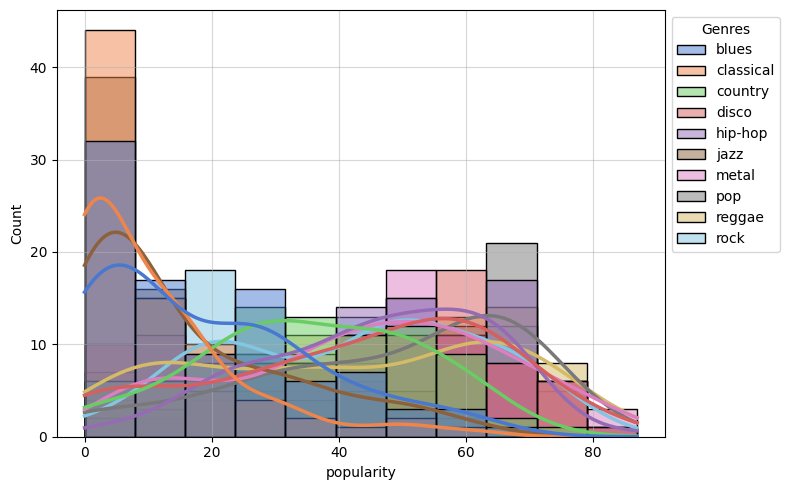

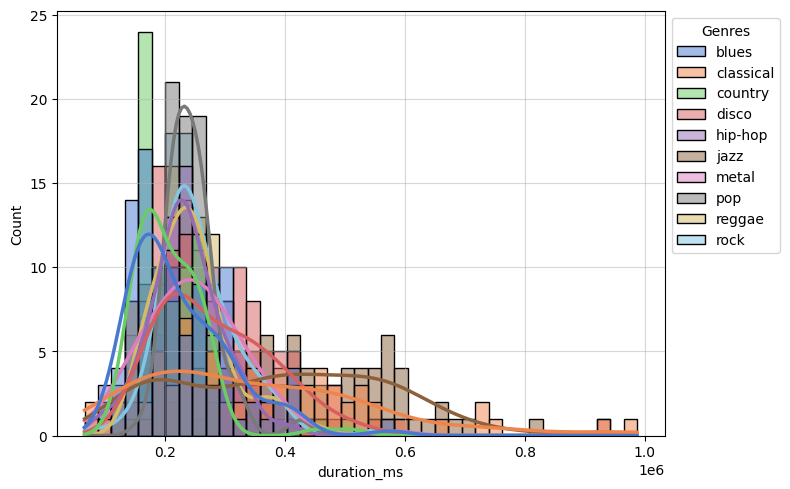

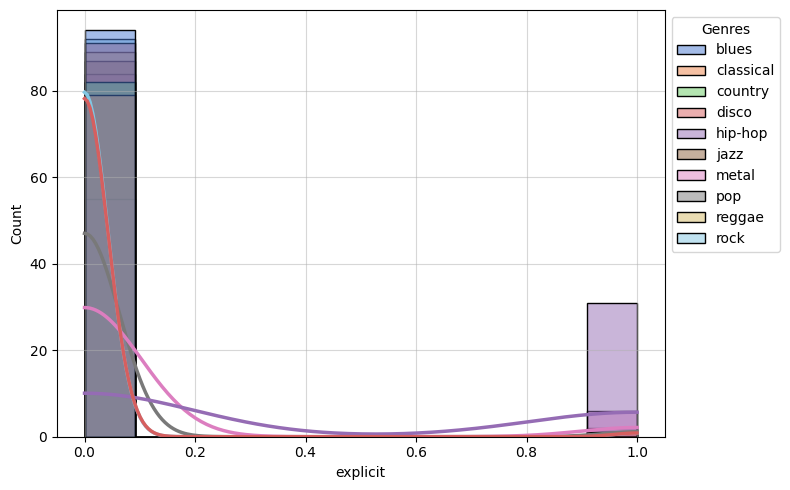

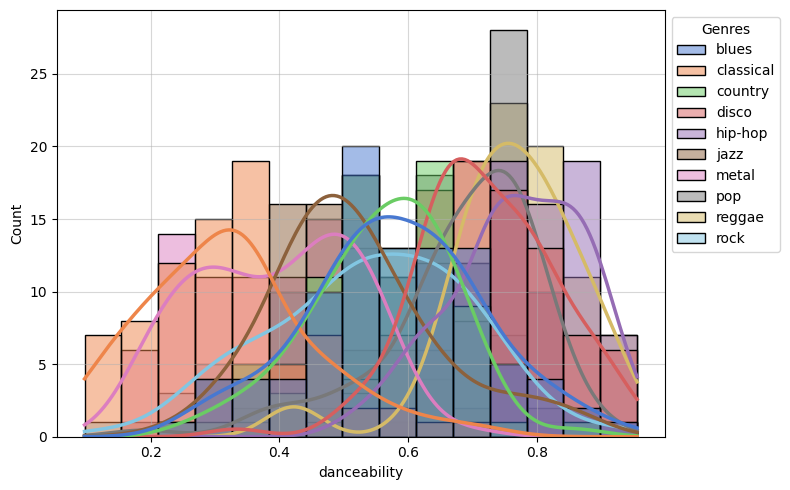

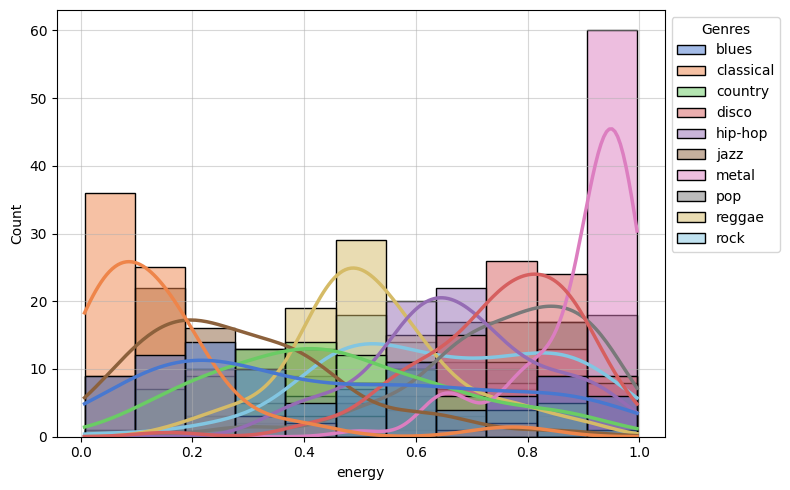

...

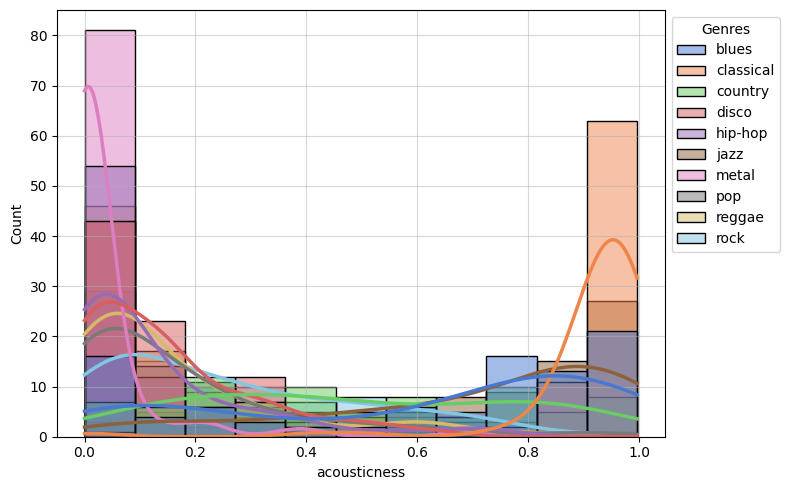

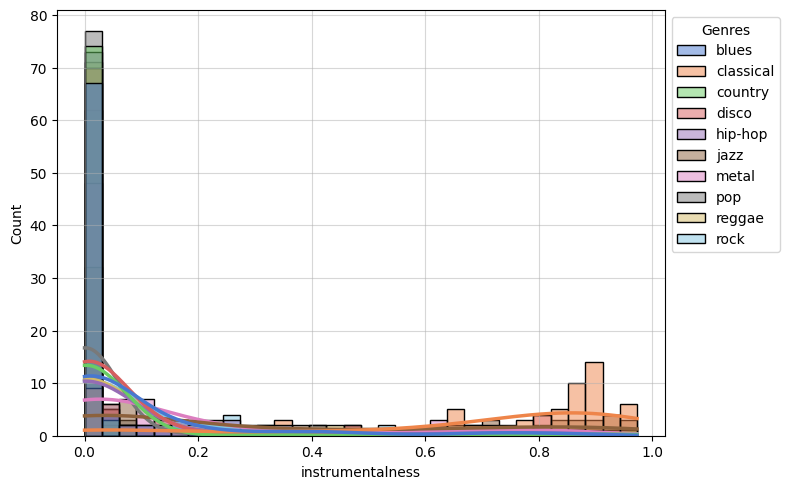

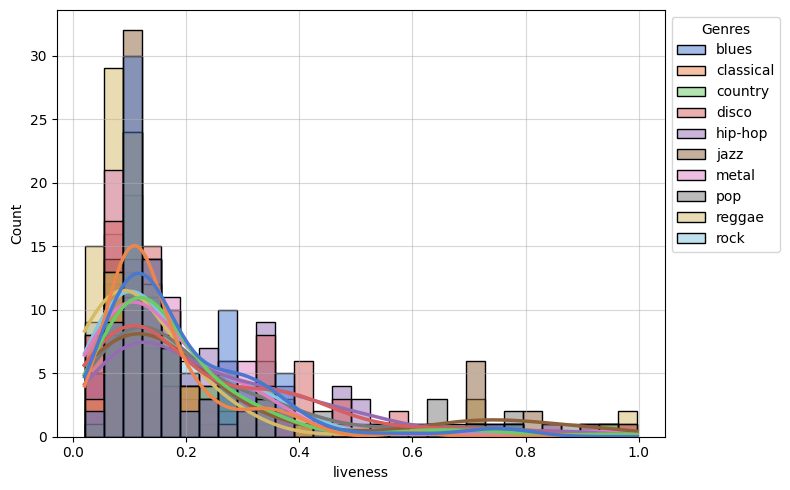

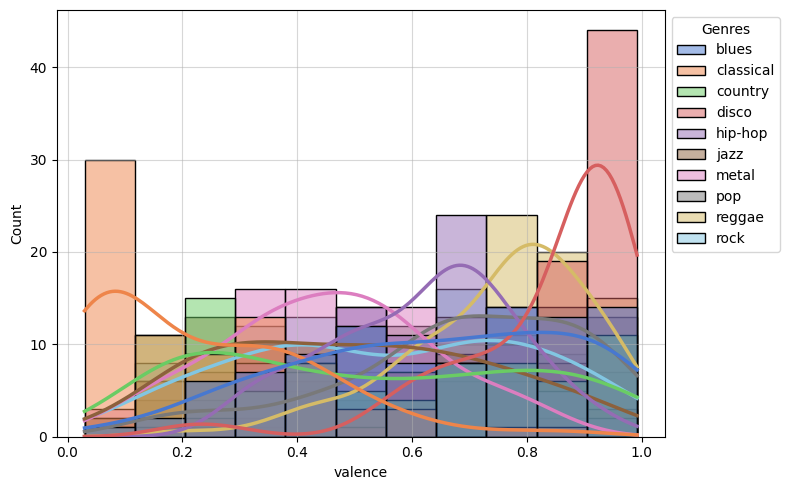

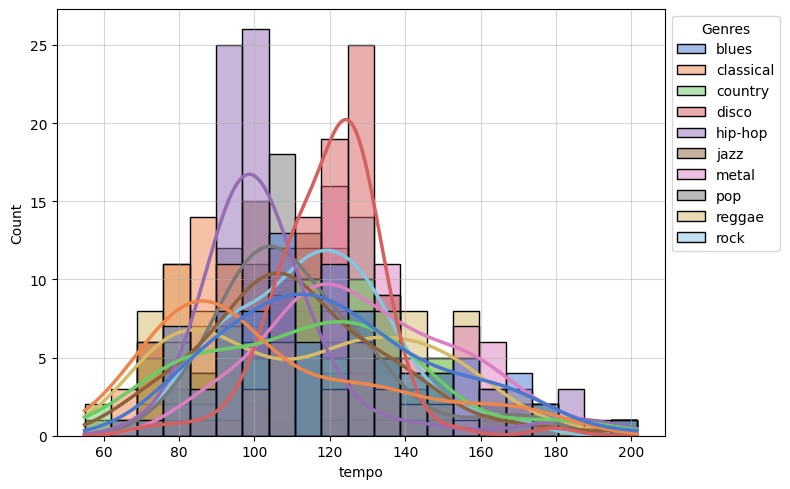

In [34]:
for col_name in original_gtzan_dataset.drop("track_genre", axis=1).columns:
    fig = plt.figure(figsize=(8,5))
    plot_genres_histogram(original_gtzan_dataset, col_name, hue="track_genre", labels=gtzan_genres)
    fig.tight_layout()

## Feature Selection
---
In this sub-section we will train for the first time the dataset, using models that might fit the best to it.

We will try to use very common useful classifiers: [Decision Trees](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), [Random Forests](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier) and [Multi-layered Perceptron](https://keras.io/api/) Model (MLP). 

In [44]:
X_ogd_train = ogd_train.drop("track_genre", axis=1)
y_ogd_train = ogd_train["track_genre"]

X_ogd_test = ogd_test.drop("track_genre", axis=1)
y_ogd_test = ogd_test["track_genre"]

## [Decision Trees](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
---

Simple idea, and yet can have very complex result. I am using decision trees first as it is simple to implement, but knowing my dataset might need extra processing (maybe feature mapping - though I don't know how to test this) it is a good starter to see if there is even possiblity to get good model that won't do much overfitting.

In [72]:
n_features_to_select = list(range(2, 14))
max_depth = list(range(4,15))

param_grid = {"sfs__n_features_to_select":n_features_to_select, "decision_tree__max_depth":max_depth}

sfs_dt = DecisionTreeClassifier(criterion="entropy", max_depth=8, random_state=42)

pipe_cls = Pipeline([
    ('normalization', MinMaxScaler()),
    ('sfs', SequentialFeatureSelector(sfs_dt)),
    ('decision_tree', DecisionTreeClassifier(criterion="entropy", random_state=42))
])

gs = GridSearchCV(estimator=pipe_cls, param_grid=param_grid, cv=5, n_jobs=-1, return_train_score=True)
gs.fit(X_ogd_train, y_ogd_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('normalization', MinMaxScaler()),
                                       ('sfs',
                                        SequentialFeatureSelector(estimator=DecisionTreeClassifier(criterion='entropy',
                                                                                                   max_depth=8,
                                                                                                   random_state=42))),
                                       ('decision_tree',
                                        DecisionTreeClassifier(criterion='entropy',
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'decision_tree__max_depth': [4, 5, 6, 7, 8, 9, 10, 11,
                                                      12, 13, 14],
                         'sfs__n_features_to_select': [2, 3, 4, 5, 6, 7, 8, 9,
                                                       10, 11, 12, 13]},
             return_train_score=True)

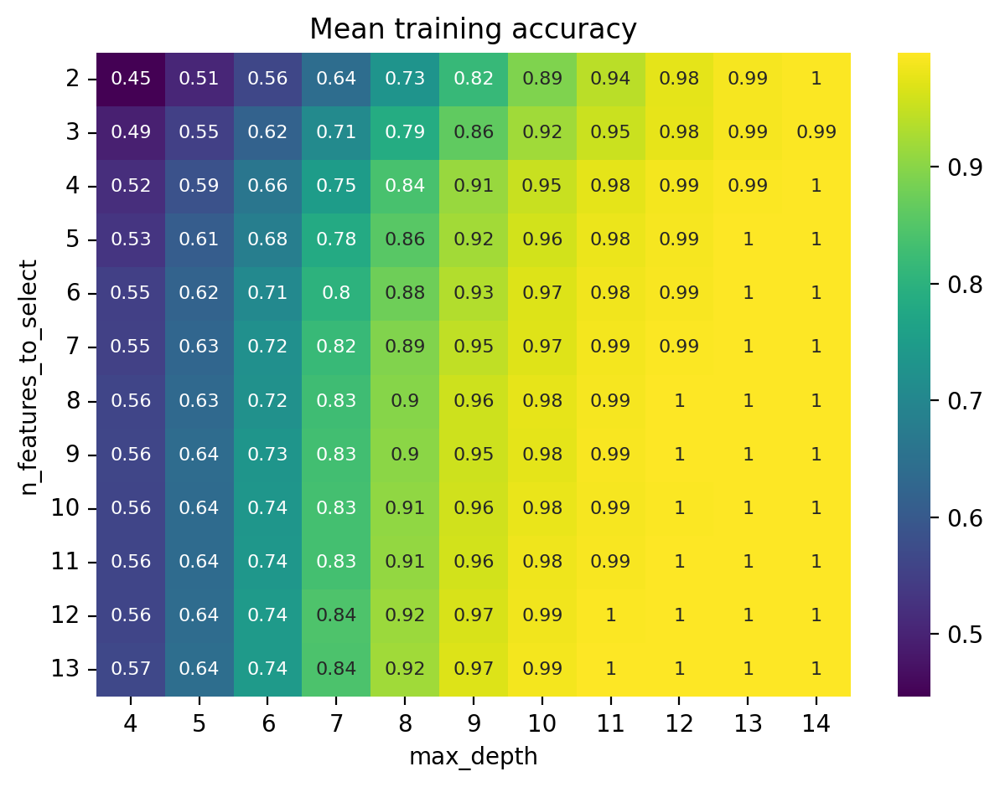

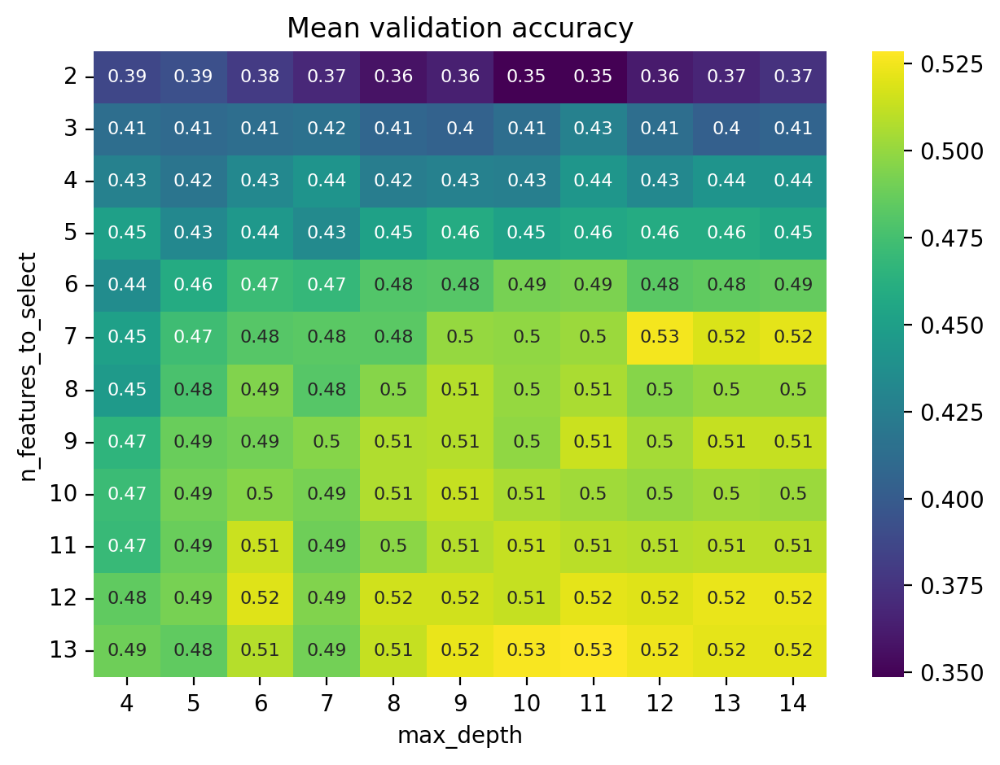

In [73]:
results = pd.DataFrame.from_dict(gs.cv_results_)

train_heatmap_dataset = results[["param_sfs__n_features_to_select", "param_decision_tree__max_depth", "mean_train_score"]].pivot_table(index="param_sfs__n_features_to_select", columns="param_decision_tree__max_depth", values="mean_train_score")

fig = plt.figure(dpi=200)
g_train = sns.heatmap(train_heatmap_dataset, annot=True, cmap="viridis", annot_kws={"fontsize":8}).set(title="Mean training accuracy", xlabel="max_depth", ylabel = "n_features_to_select")
plt.yticks(rotation=0) 
fig.tight_layout()

test_heatmap_dataset = results[["param_sfs__n_features_to_select", "param_decision_tree__max_depth", "mean_test_score"]].pivot_table(index="param_sfs__n_features_to_select", columns="param_decision_tree__max_depth", values="mean_test_score")

fig = plt.figure(dpi=200)
g_test = sns.heatmap(test_heatmap_dataset, annot=True, cmap="viridis", annot_kws={"fontsize":8}).set(title="Mean validation accuracy", xlabel="max_depth", ylabel = "n_features_to_select")
plt.yticks(rotation=0) 
fig.tight_layout()

In [96]:
dt = DecisionTreeClassifier(criterion="entropy", max_depth=8, random_state=42)
sfs = SequentialFeatureSelector(dt, n_features_to_select=9)

scaler = MinMaxScaler()
cols = X_ogd_train.columns
normalized_train = pd.DataFrame(scaler.fit_transform(X_ogd_train), columns=cols)
normalized_test = pd.DataFrame(scaler.transform(X_ogd_test), columns=cols)

sfs.fit(normalized_train, y_ogd_train)

criteria = sfs.get_support().tolist() # The last True value is to let the target variable 'genre' to join the new shrunked dataset
selective_train = normalized_train[normalized_train.columns[criteria]]
selective_test = normalized_test[normalized_test.columns[criteria]]
sfs.get_feature_names_out()

array(['duration_ms', 'popularity', 'explicit', 'danceabilitiy',
       'loudness', 'speechiness', 'acousticness', 'valence', 'tempo'],
      dtype=object)

In [102]:
dt = DecisionTreeClassifier(criterion="entropy", max_depth=11, random_state=42)
dt.fit(selective_train, y_ogd_train)

train_accuracy = dt.score(selective_train, y_ogd_train)
print(f"score train accuracy: {train_accuracy}")
test_accuracy = dt.score(selective_test, y_ogd_test)
print(f"score test accuracy: {test_accuracy}")

fig = plt.figure(figsize=(64, 9), dpi=300)
plot_tree(dt, filled=True, class_names=le_genre.inverse_transform(y_train.unique()), feature_names=selective_train.columns, fontsize=6)
plt.tight_layout()

score train accuracy: 0.9957142857142857
score test accuracy: 0.48863636363636365


Text(0.5, 1.0, 'Confusion Matrix of Decision Tree on test set')

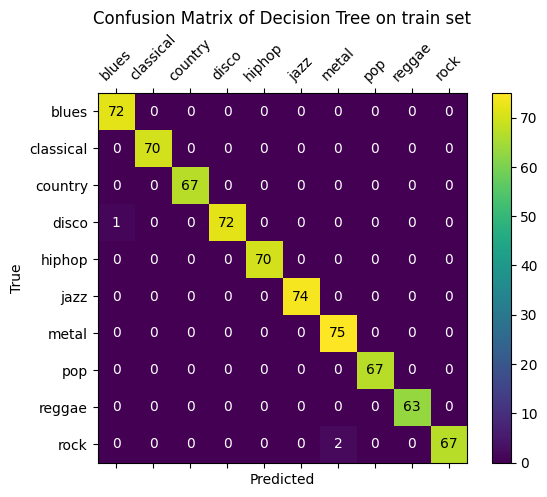

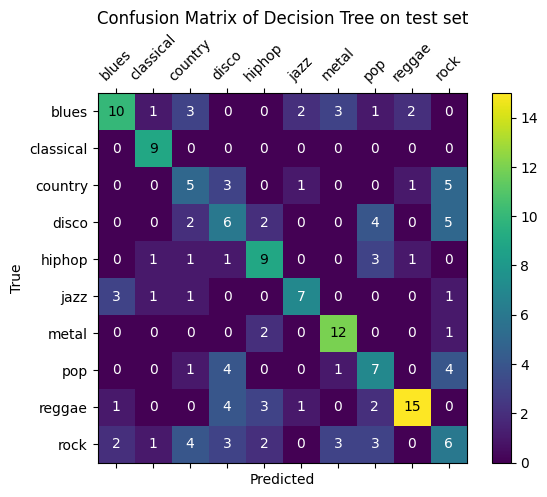

In [187]:
# DT1
labels = list(le_genre.inverse_transform(range(10)))

dt1 = DecisionTreeClassifier(criterion="entropy", max_depth=11, random_state=42)
dt1.fit(selective_train, y_ogd_train)

fig11, ax11 = display_rf_confusion_matrix(dt1, selective_train, y_ogd_train, labels)
ax11.set_title("Confusion Matrix of Decision Tree on train set")
fig12, ax12 = display_rf_confusion_matrix(dt1, selective_test, y_ogd_test, labels)
ax12.set_title("Confusion Matrix of Decision Tree on test set")

## [Random Forests](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier)
---

A better version of decision trees as it is containing the advantages of ensamble models. As we learned in AdaBoost, ensamble and boosting models use weights on the models themselves to get which basic models give better results and this way have more generalized yet accurate models.

With this model, we will also use tuning to seek for the best hyper-parameters to fit the model with for getting best results

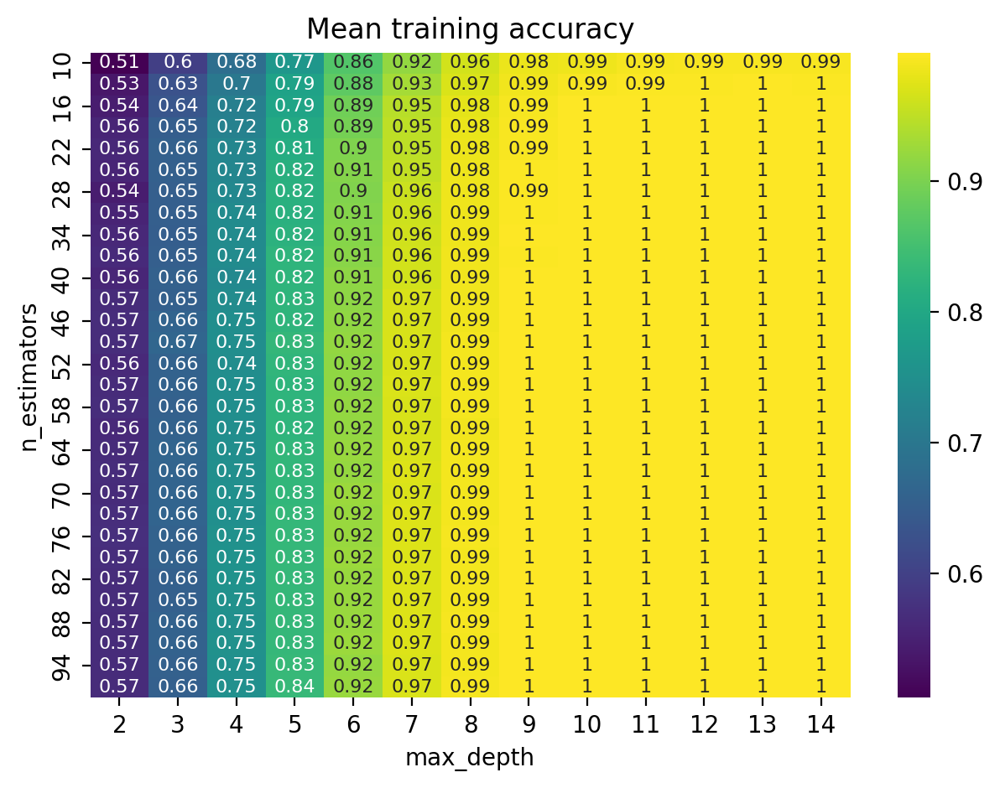

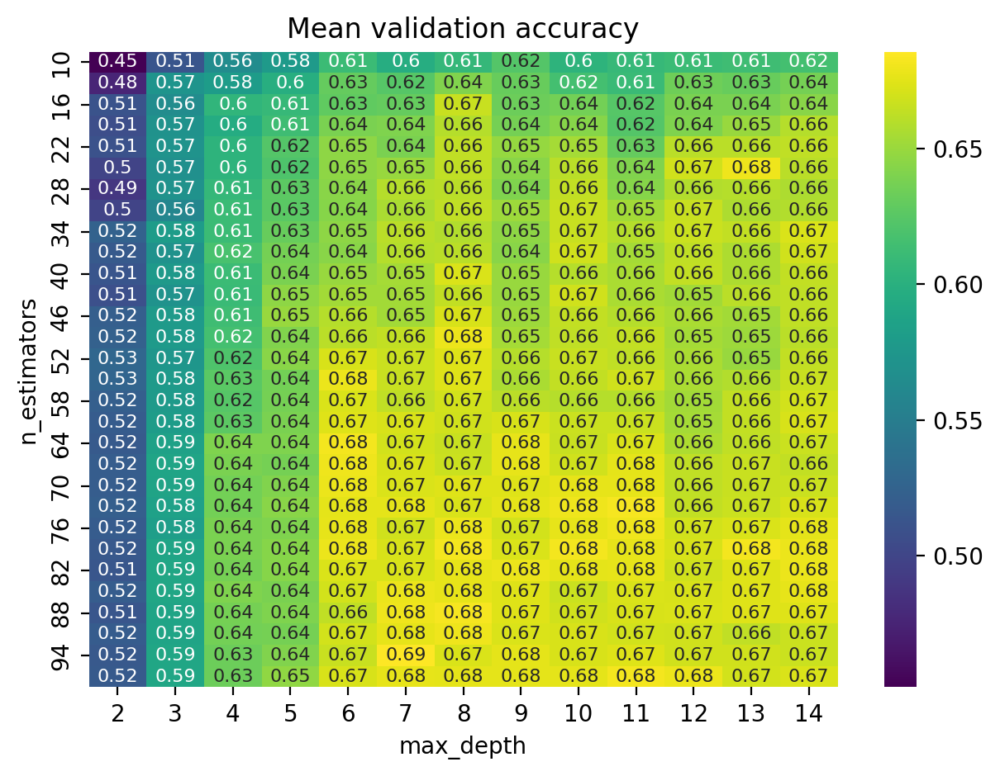

In [112]:
n_estimators = list(range(10, 100, 3))
max_depth = list(range(2,15))

train_and_plot_RF(X_ogd_train, y_ogd_train, n_estimators, max_depth, gs_save_path=(".misc\\pickled_models\\ogd_rf.pkl"))

RF1 Train Accuracy: 99.71428571428571%
RF1 Test Accuracy: 67.61363636363636%


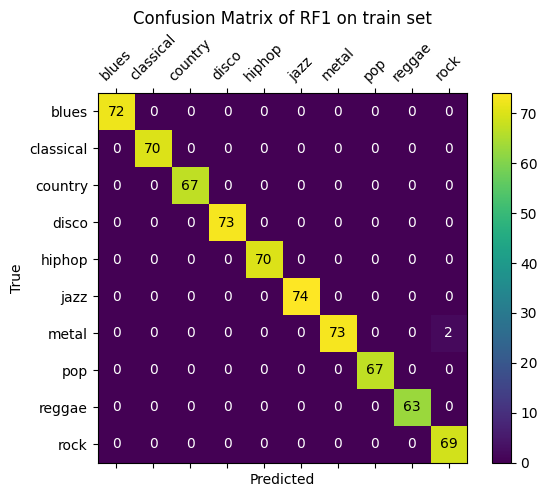

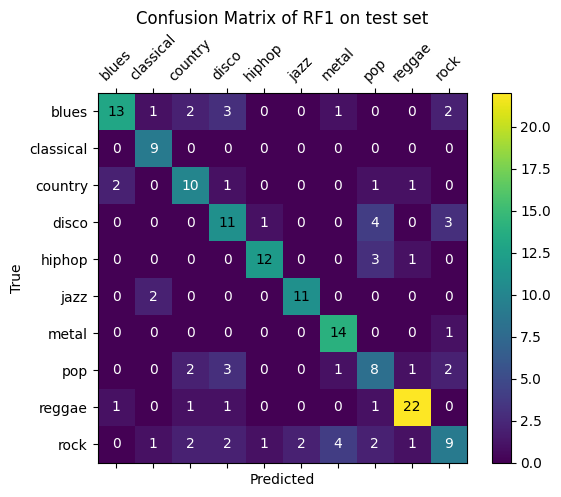

In [45]:
# RF_OGD_1
labels = list(le_genre.inverse_transform(range(10)))

rf_ogd_1 = Pipeline([
        ('normalization', MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=73, max_depth=11, random_state=42))
])
rf_ogd_1.fit(X_ogd_train, y_ogd_train)

fig11, ax11 = display_rf_confusion_matrix(rf_ogd_1, X_ogd_train, y_ogd_train, labels)
ax11.set_title("Confusion Matrix of RF1 on train set")
fig12, ax12 = display_rf_confusion_matrix(rf_ogd_1, X_ogd_test, y_ogd_test, labels)
ax12.set_title("Confusion Matrix of RF1 on test set")

print(f"RF1 Train Accuracy: {rf_ogd_1.score(X_ogd_train, y_ogd_train) * 100}%")
print(f"RF1 Test Accuracy: {rf_ogd_1.score(X_ogd_test, y_ogd_test) * 100}%")

The following blocks are not mentioned in the report at all the they discuss on a try that meant to improve the random forest even more via feature transformation:

In [122]:
from copy import deepcopy

def split_list(elem_list):
    splits = []
    split_list_aux([], elem_list, splits)
    return unique(splits)

def split_list_aux(curr_split_build, left_elem_list, splits):
    if len(left_elem_list) == 0:
        splits.append(deepcopy(curr_split_build))
        return
    for i in left_elem_list:
        left_elem_list.remove(i)
        for subset in curr_split_build:
            curr_split_build.remove(subset)
            subset.append(i)
            curr_split_build.append(subset)
            
            split_list_aux(curr_split_build, left_elem_list, splits)
    
            curr_split_build.remove(subset)
            subset.remove(i)
            curr_split_build.append(subset)

        new_subset = [i]
        curr_split_build.append(new_subset)
        split_list_aux(curr_split_build, left_elem_list, splits)
        curr_split_build.remove(new_subset)
        
        left_elem_list.append(i)
        
def unique(_list):
    # initialize a null list
    no_copy = []
    unique_list = []

    # traverse for all elements
    for x in _list:
        # check if exists in unique_list or not
        if x not in no_copy:
            no_copy.append(x)
        
    for x in no_copy:
        in_unique = False
        for y in unique_list:
            _x = set(frozenset(s) for s in x)
            _y = set(frozenset(s) for s in y)
            if _x == _y:
                in_unique = True
                break;
        if not in_unique:
            unique_list.append(x)

    return unique_list

In [123]:
split_list([1,2,3,4])

[[[1, 2, 3, 4]],
 [[1, 2, 3], [4]],
 [[3], [1, 2, 4]],
 [[3], [1, 2], [4]],
 [[1, 4], [2, 3]],
 [[1, 4], [2], [3]],
 [[1], [4], [2, 3]],
 [[1], [2], [4, 3]],
 [[1], [2], [4], [3]],
 [[1, 4, 3], [2]],
 [[1, 2], [4, 3]],
 [[2, 3, 4], [1]],
 [[4], [1, 3], [2]],
 [[1], [3], [2, 4]],
 [[1, 3], [2, 4]]]

In [124]:
def build_columns_transformer(rbf_features_indices, _RBFSampler: RBFSampler, poly_features_indices, _PolynomialFeatures: PolynomialFeatures):
    transformers = []
    for i in range(len(rbf_features_indices)):
        transformers.append(tuple([f"RBF Transformer ({i})", _RBFSampler, rbf_features_indices[i]]))
    for i in range(len(poly_features_indices)):
        transformers.append(tuple([f"Poly Transformer ({i})", _PolynomialFeatures, poly_features_indices[i]]))
        
    return ColumnTransformer(transformers=transformers)

In [137]:
sus_features = ["danceability", "energy", "loudness", "tempo", "valence"]
sus_features_indices = [X_train.columns.get_loc(feature) for feature in sus_features]

all_mapping_scores = pd.DataFrame(columns=["rbf_features", "poly_features", "mean_train_score", "std_train_score" ,"mean_validation_score", "std_validation_score"])

from itertools import combinations

for i in range(len(sus_features) + 1):
    for rbf_group in combinations(sus_features_indices, i):      
        poly_group = tuple([index for index in sus_features_indices if index not in rbf_group])
        for rbf_split in split_list(list(rbf_group)):
            for poly_split in split_list(list(poly_group)):
                
                ct = build_columns_transformer(rbf_split,
                                               RBFSampler(gamma=0.01, n_components=10, random_state=42),
                                               poly_split,
                                               PolynomialFeatures(degree=5))
                
                rf_regr = Pipeline([
                    ('normalization', MinMaxScaler()),
                    ('feature_mapping', ct),
                    ('random_forest', RandomForestClassifier(random_state=42))
                ])
                
                curr_scores = cross_validate(rf_regr, X_train, y_train.ravel(), cv=5, n_jobs=-1, return_train_score=True, error_score='raise')
                
                current_mapping_score = pd.DataFrame([{
                        "rbf_features": [[X_train.columns[i] for i in batch] for batch in rbf_split],
                        "poly_features": [[X_train.columns[i] for i in batch] for batch in poly_split], 
                        "mean_train_score":np.mean(curr_scores["train_score"]),
                        "std_train_score":np.std(curr_scores["train_score"]),
                        "mean_validation_score":np.mean(curr_scores["test_score"]),
                        "std_validation_score":np.std(curr_scores["test_score"])
                    }])
                all_mapping_scores = pd.concat([all_mapping_scores, current_mapping_score], ignore_index=True, axis=0, join='outer')

In [143]:
all_mapping_scores.sort_values(by=['mean_validation_score', 'std_validation_score']  , ascending=[False, True]).head(10)

,rbf_features,poly_features,mean_train_score,std_train_score,mean_validation_score,std_validation_score
427,"[[tempo], [danceability, loudness], [energy, v...",[],0.997857,0.00175,0.582857,0.027701
356,"[[danceability, loudness], [energy, valence]]",[[tempo]],0.997857,0.00175,0.577143,0.021853
121,[[valence]],"[[danceability, tempo, loudness], [energy]]",0.997857,0.00175,0.575714,0.030170
260,"[[danceability, loudness], [tempo]]","[[energy], [valence]]",0.997857,0.00175,0.574286,0.013248
341,"[[danceability, loudness], [energy, tempo]]",[[valence]],0.997857,0.00175,0.574286,0.033685
141,"[[danceability, loudness]]","[[tempo, valence], [energy]]",0.997857,0.00175,0.570000,0.016537
269,"[[danceability, loudness], [valence]]","[[energy, tempo]]",0.997857,0.00175,0.570000,0.005345
426,"[[energy], [tempo], [danceability, loudness], ...",[],0.997857,0.00175,0.570000,0.005345
367,"[[danceability, energy], [valence, tempo]]",[[loudness]],0.997857,0.00175,0.568571,0.014708
167,"[[energy, loudness]]","[[danceability, tempo, valence]]",0.997857,0.00175,0.568571,0.026573


## [Multi-layered Perceptron](https://keras.io/api/)
---
For the neural network models, I also had that idea of checking which genres yield the best results for the neural network (for example which 6 out of the 10 available yeild best diffentiation. I didn't put that experiment in the report because I later did something similar with the bigger dataset which had a lot more options and I just carefully selected 12 that I thought will be more distiguishable than the 10 of GTZAN genres.

In [49]:
# Taking steps that will ensure that on the same device re-running will yield the same weights
np.random.seed(42)
tf.random.set_seed(42)

In [50]:
scaler = MinMaxScaler()
cols = X_train.columns
normalized_train = pd.DataFrame(scaler.fit_transform(X_train), columns=cols)
normalized_test = pd.DataFrame(scaler.transform(X_test), columns=cols)

genres = le_genre.transform(["blues","classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"])
genres_to_learn = genres #["disco", "classical", "metal", "hiphop", "jazz"] #["country", "pop", "rock", "blues", "reggae"]

normalized_train = normalized_train.drop(y_train[y_train.isin([genre for genre in genres if genre not in genres_to_learn])].index, axis=1)
normalized_test = normalized_test.drop(y_test[y_test.isin([genre for genre in genres if genre not in genres_to_learn])].index, axis=1)

In [51]:
inputs = keras.Input(shape=(normalized_train.columns.size,))
hl_1 = Dense(units = 128, activation = "relu")(inputs)
dropout_1 = Dropout(0)(hl_1)
hl_2 = Dense(units = 64, activation = "relu")(dropout_1)
dropout_2 = Dropout(0)(hl_2)
hl_3 = Dense(units = 32, activation = "relu")(dropout_2)
dropout_3 = Dropout(0)(hl_3)
outputs = Dense(len(genres_to_learn), activation="softmax")(dropout_3)

clf = keras.Model(inputs=inputs, outputs=outputs)

clf.compile(
    loss=keras.losses.SparseCategoricalCrossentropy(),
    optimizer=keras.optimizers.RMSprop(),
    metrics=["accuracy",
             keras.metrics.SparseCategoricalAccuracy()]
)

epochs = 100
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights = True)

history = clf.fit(normalized_train, y_train, batch_size=32, epochs=epochs, validation_split=0.2, callbacks=[early_stop], verbose=0)

test_scores = clf.evaluate(normalized_test, y_test)
print("Test loss:", test_scores[0])
print("Test accuracy:", test_scores[1])

6/6 [==============================] - 0s 0s/step - loss: 1.3394 - accuracy: 0.5909 - sparse_categorical_accuracy: 0.5909
Test loss: 1.3394362926483154
Test accuracy: 0.5909090638160706


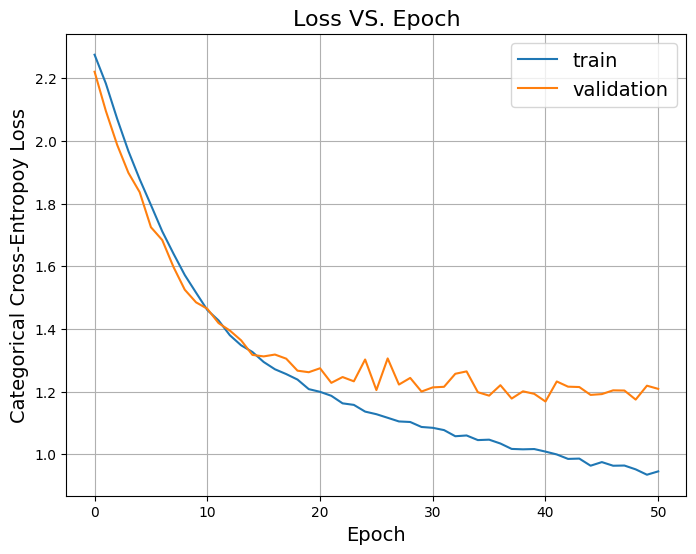

In [70]:
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(list(range(len(history.history["loss"]))), list(zip(history.history["loss"], history.history["val_loss"])))
ax.grid(True)
ax.set_title("Loss VS. Epoch", fontsize=16)
ax.set_xlabel("Epoch", fontsize=14)
ax.set_ylabel("Categorical Cross-Entropoy Loss", fontsize=14)
ax.legend(["train", "validation"], fontsize=14)

6/6 [==============================] - 0s 3ms/step
Train accuracy: 0.6628571152687073
Test accuracy: 0.5909090638160706


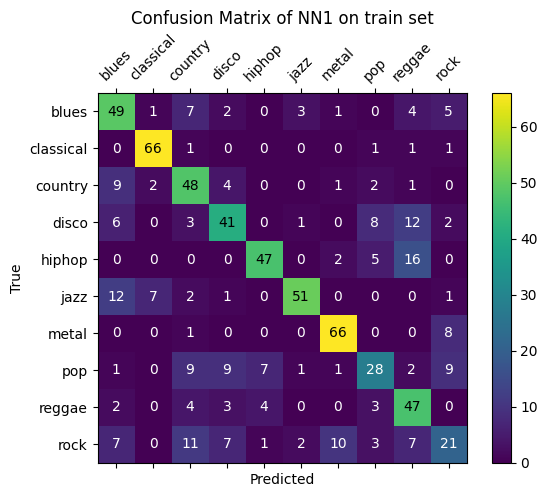

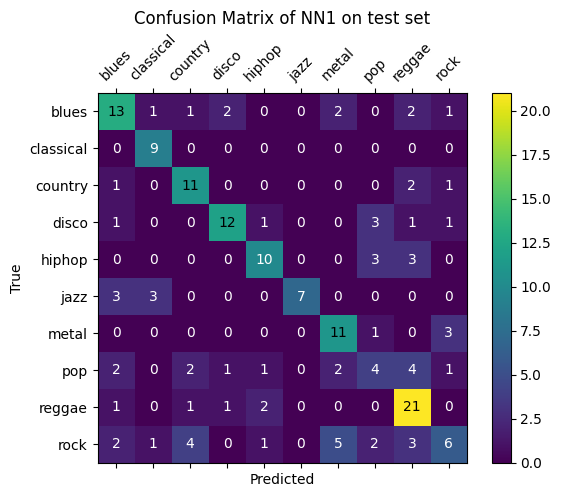

In [53]:
labels = list(le_genre.inverse_transform(genres_to_learn))

fig11, ax11 = display_sparse_categorical_nn_confusion_matrix(clf, normalized_train, y_train, labels)
ax11.set_title("Confusion Matrix of NN1 on train set")
fig12, ax12 = display_sparse_categorical_nn_confusion_matrix(clf, normalized_test, y_test, labels)
ax12.set_title("Confusion Matrix of NN1 on test set")

train_scores = clf.evaluate(normalized_train, y_train, verbose=0)
print("Train accuracy:", train_scores[1])
test_scores = clf.evaluate(normalized_test, y_test, verbose=0)
print("Test accuracy:", test_scores[1])


# Spotify Tracks Dataset
---
We first need to explore the data, find intereseting connections between the different features and the target.

**Notes**:
- Might use the `track_id` feature later on to extract more information about each track (By calling for audio-analysis which give a lot more data about the track)
- Explore more genres with customs datasets

Remember: the dataset is already loaded at the beginning. I also assume at this point that you downloaded from spotify all necessary files (all the files that starts with `spotify_...`.

In [17]:
# Remove uninformative columns
compact_gtzan_dataset = gtzan_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)
compact_nacho_dataset = nacho_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Encode Necessary columns (e.g. explicit)
le_explicit = preprocessing.LabelEncoder()
compact_gtzan_dataset.explicit = le_explicit.fit_transform(compact_gtzan_dataset.explicit)
compact_nacho_dataset.explicit = le_explicit.transform(compact_nacho_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
compact_gtzan_dataset.track_genre = le_gtzan_genre.fit_transform(compact_gtzan_dataset.track_genre)

le_nacho_genre = preprocessing.LabelEncoder()
compact_nacho_dataset.track_genre = le_nacho_genre.fit_transform(compact_nacho_dataset.track_genre)

Let us view the different features in relation to the genre, and find correlations. Again, it was just for my judgement so I can understand the data better. I know there were tails that I should have taken out of the dataset (might have improved my statistics) but I got lazy 😅

C:\Users\Tomer\AppData\Local\Temp\ipykernel_3676\2102801276.py:14: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  hist_ax = sns.histplot(ax=ax, data=df, x=x, y=y, hue=hue, bins=bins, kde=kde, line_kws={"linewidth": 2.5}, multiple=multiple, palette=palette, legend=legend)


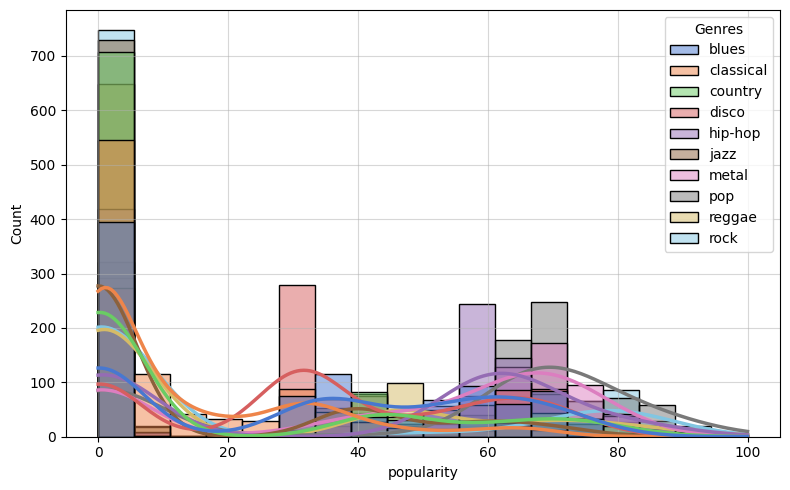

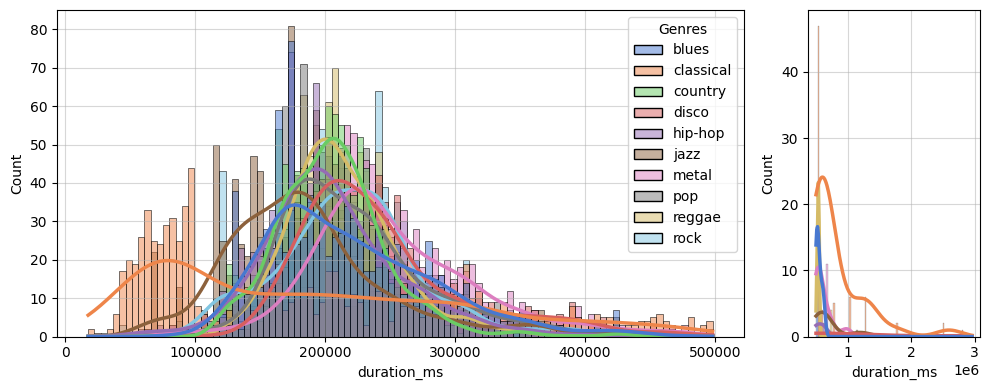

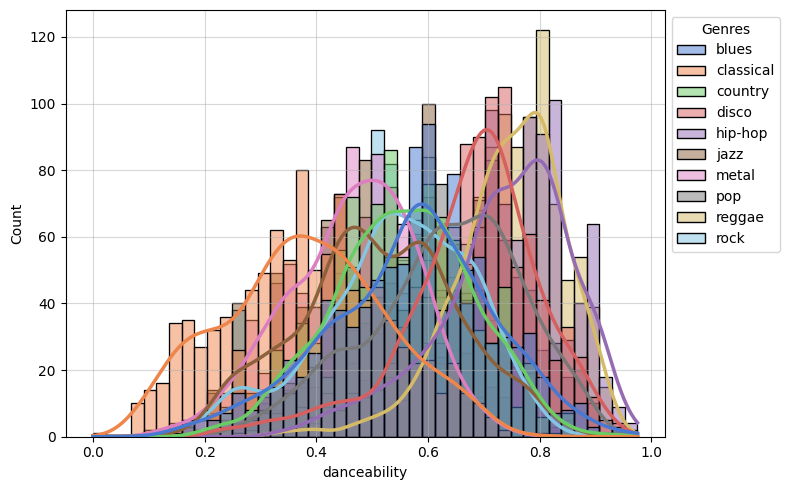

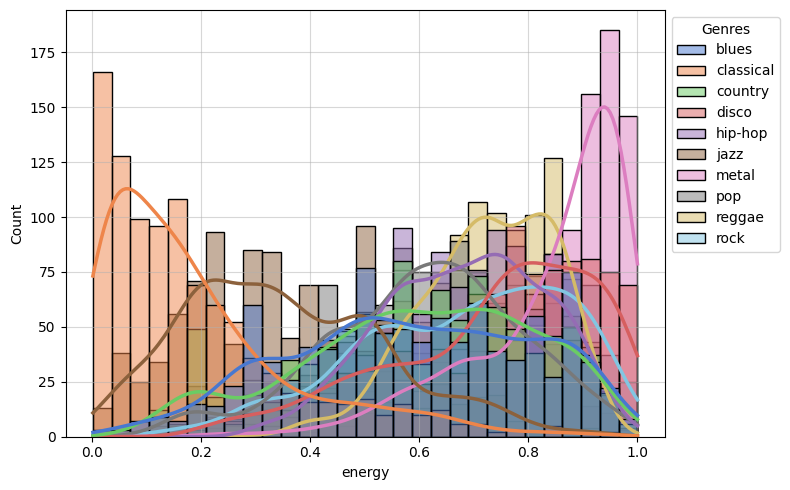

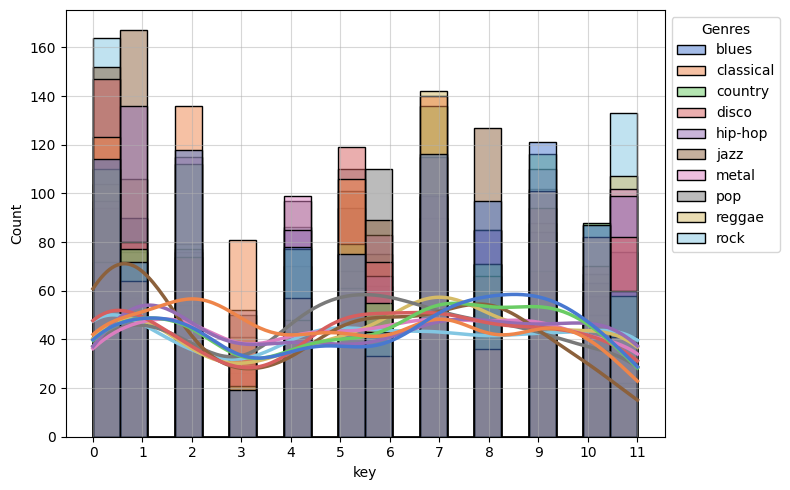

...

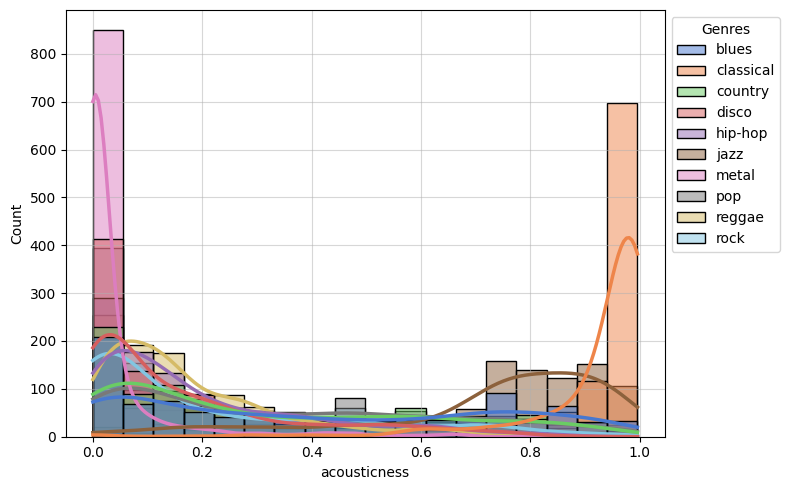

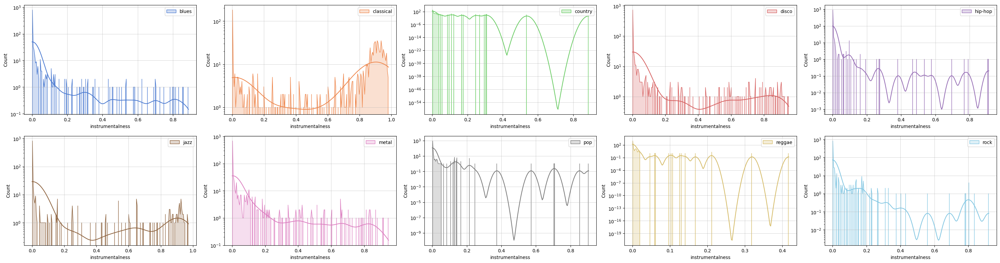

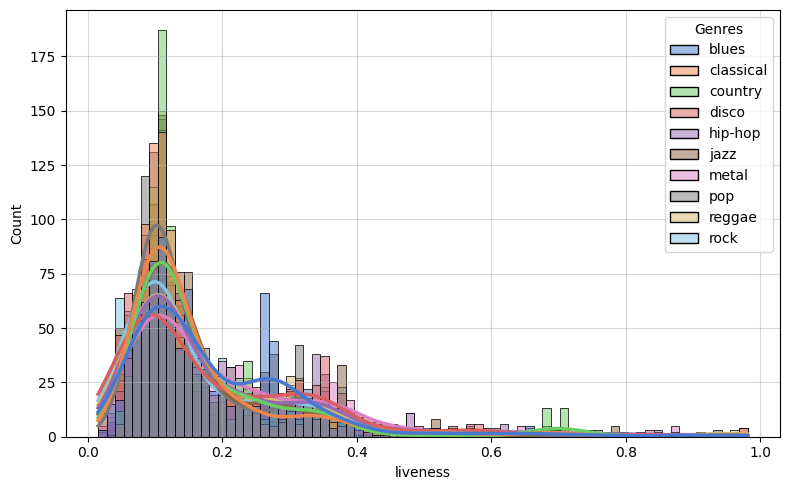

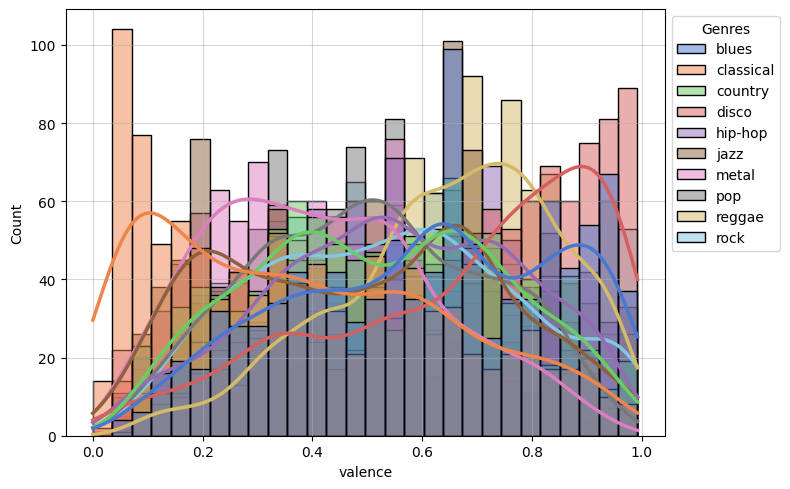

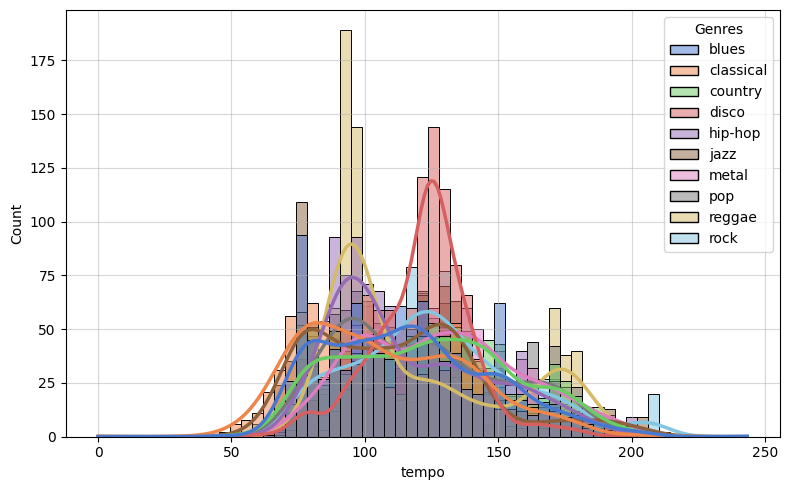

In [191]:
# Popularity #
# ---------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "popularity", hue="track_genre", labels=gtzan_genres, legend_out=False)
fig.tight_layout()

# Duration in milliseconds #
# ------------------------ #
fig, axes = plt.subplots(1,2, figsize=(10,4), gridspec_kw={'width_ratios': [4, 1]})
plot_genres_histogram(compact_gtzan_dataset.query("duration_ms < 0.5e6"), "duration_ms", hue="track_genre", labels=gtzan_genres, bins=100, legend=True, legend_out=False, ax=axes[0])
plot_genres_histogram(compact_gtzan_dataset.query("duration_ms >= 0.5e6"), "duration_ms", hue="track_genre", labels=gtzan_genres, bins=10, multiple="dodge", legend=False, ax=axes[1])
fig.tight_layout()

# Danceability #
# ------------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "danceability", hue="track_genre", labels=gtzan_genres, legend_side="left")
fig.tight_layout()

# Energy #
# ------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "energy", hue="track_genre", labels=gtzan_genres)
fig.tight_layout()

# Key #
# --- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "key", hue="track_genre", labels=gtzan_genres, discrete=True, shrink=0.8)
plt.xticks(np.arange(min(compact_gtzan_dataset.key.unique()), max(compact_gtzan_dataset.key.unique())+1, 1.0))
fig.tight_layout()

# Loudness #
# -------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "loudness", hue="track_genre", labels=gtzan_genres, legend_out=False, legend_side="left")
fig.tight_layout()

# Speechiness #
# ----------- #
fig, axes = plt.subplots(2,5, figsize=(30,8))
for i in range(2):
    for j in range(5):
        genre = gtzan_genres[5*i+j]
        mini_dataset = compact_gtzan_dataset[compact_gtzan_dataset.track_genre == le_gtzan_genre.transform([genre])[0]]
        ax = axes[i,j]
        
        hue_order = le_gtzan_genre.transform(gtzan_genres)
        palette = "muted"
        hist_ax = sns.histplot(mini_dataset, x="speechiness", hue="track_genre", hue_order=hue_order, kde=True, palette=palette, ax=ax)
        ax.grid(alpha=0.5)
#         ax.set_title(f"Speechiness in {genre}")
        
        # Legend handling
        _legend = ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        ax.legend([_handles[gtzan_genres.index(genre)]], [genre], loc="upper right")
fig.tight_layout()

# Acousticness #
# ------------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "acousticness", hue="track_genre", labels=gtzan_genres)
fig.tight_layout()

# Instrumentalness #
# ---------------- #
fig, axes = plt.subplots(2,5, figsize=(30,8))
for i in range(2):
    for j in range(5):
        genre = gtzan_genres[5*i+j]
        mini_dataset = compact_gtzan_dataset[compact_gtzan_dataset.track_genre == le_gtzan_genre.transform([genre])[0]]
        ax = axes[i,j]
        
        hue_order = le_gtzan_genre.transform(gtzan_genres)
        palette = "muted"
        hist_ax = sns.histplot(mini_dataset, x="instrumentalness", hue="track_genre", hue_order=hue_order, bins=200, kde=True, element='poly', palette=palette, ax=ax)
        ax.set_yscale('log')
        ax.grid(alpha=0.5)
#         ax.set_title(f"Instrumentalness in {genre}")
        
        # Legend handling
        _legend = ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        ax.legend([_handles[gtzan_genres.index(genre)]], [genre], loc="upper right")
fig.tight_layout()

# Liveness #
# -------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "liveness", hue="track_genre", labels=gtzan_genres, legend_out=False)
fig.tight_layout()

# Valence #
# ------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "valence", hue="track_genre", labels=gtzan_genres)
fig.tight_layout()

# Tempo #
# ----- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(compact_gtzan_dataset, "tempo", hue="track_genre", labels=gtzan_genres, legend_out=False)
fig.tight_layout()

C:\Users\Tomer\AppData\Local\Temp\ipykernel_3676\2102801276.py:14: UserWarning: The palette list has more values (12) than needed (8), which may not be intended.
  hist_ax = sns.histplot(ax=ax, data=df, x=x, y=y, hue=hue, bins=bins, kde=kde, line_kws={"linewidth": 2.5}, multiple=multiple, palette=palette, legend=legend)


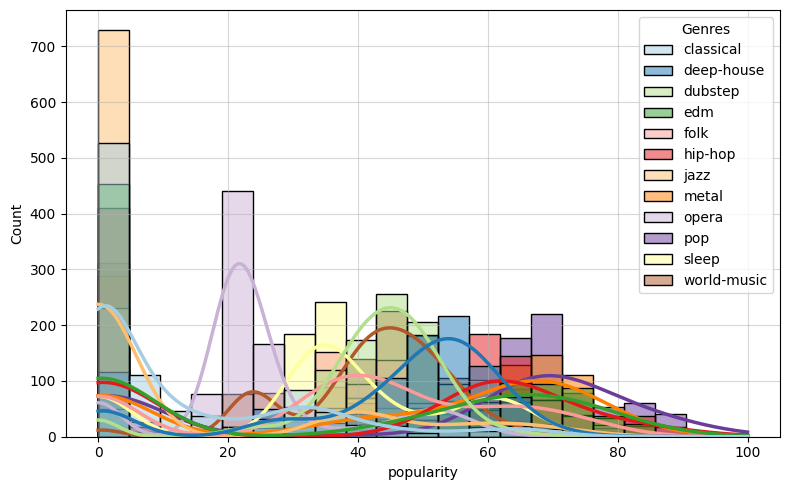

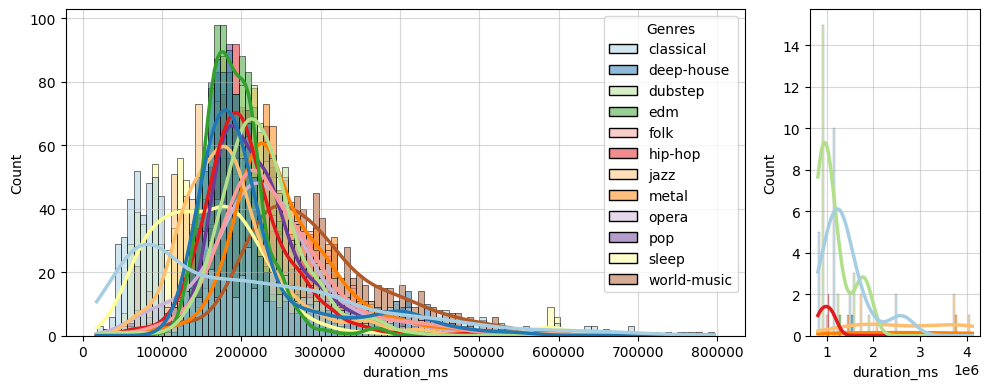

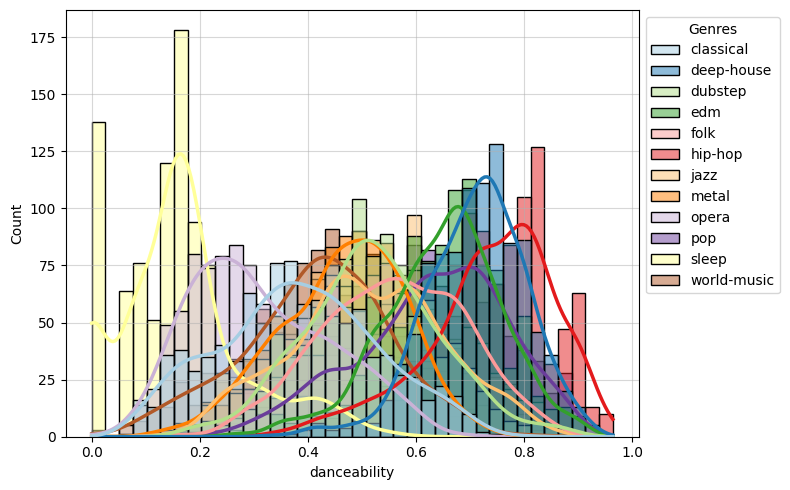

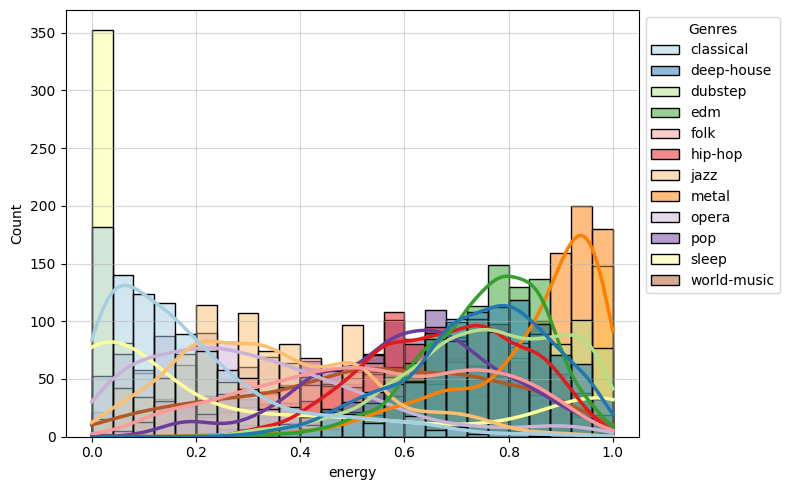

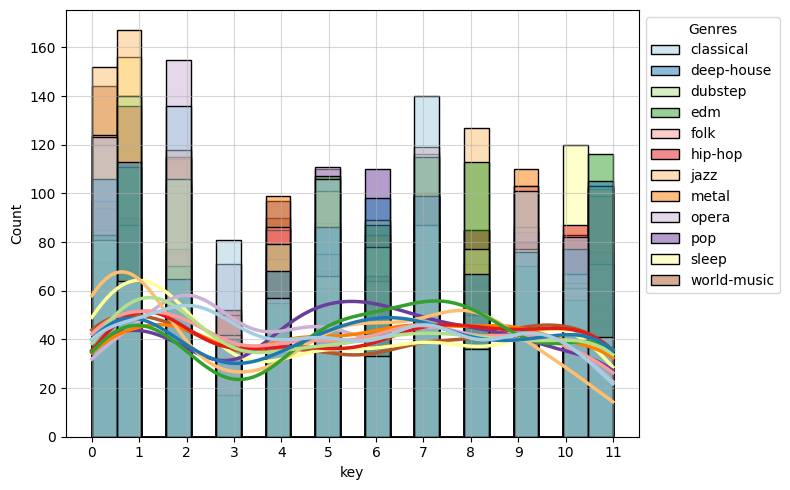

...

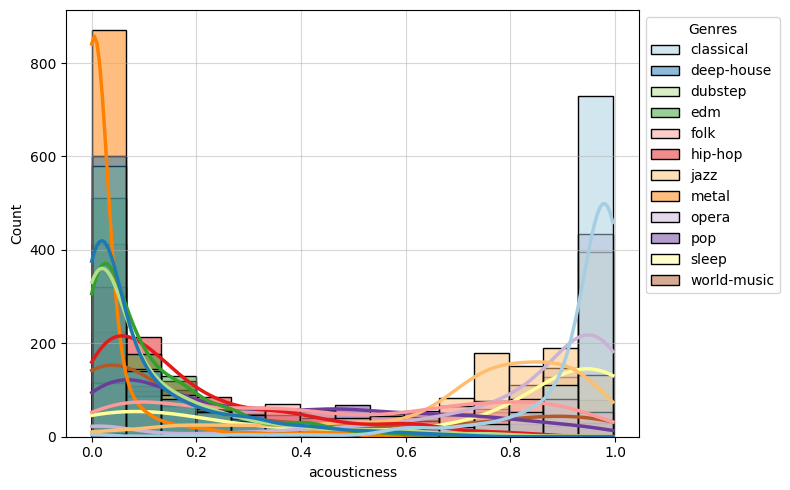

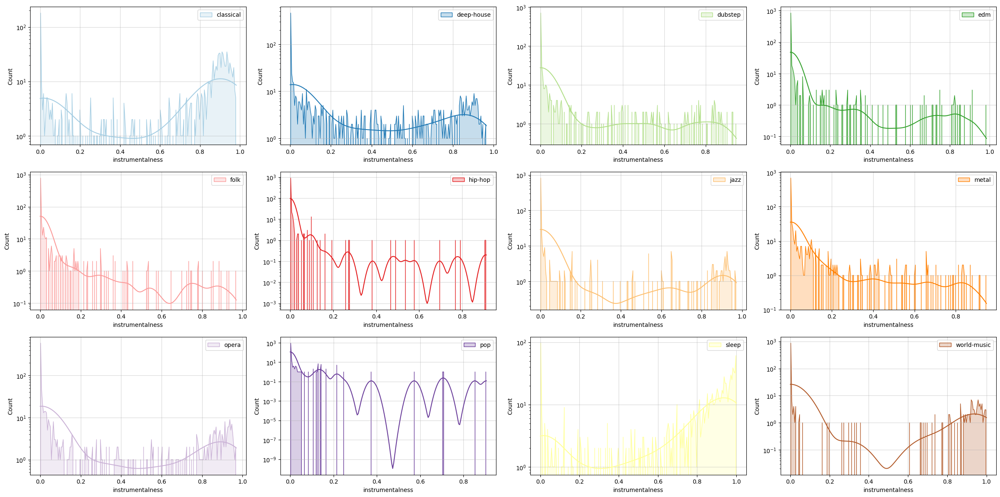

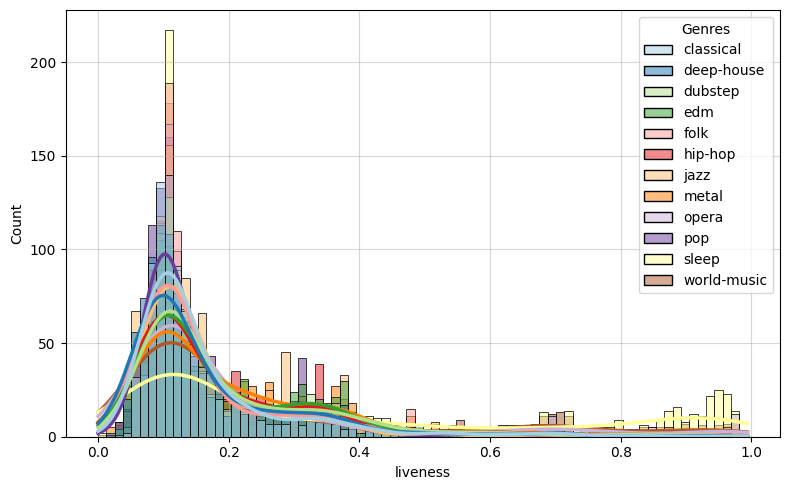

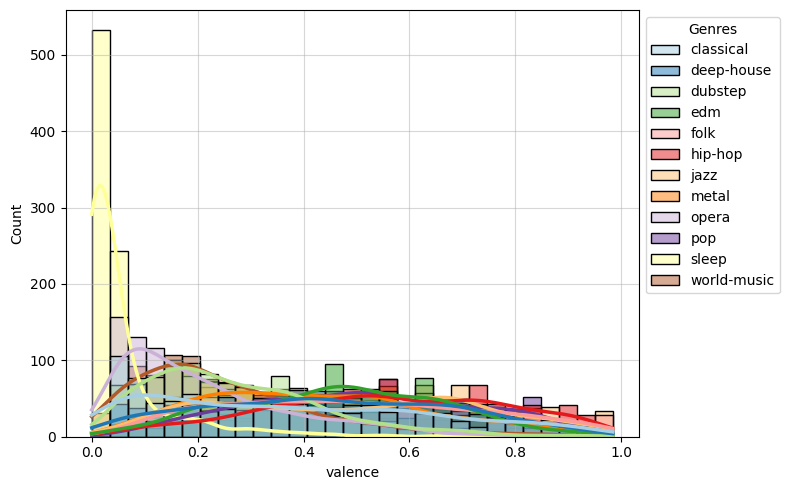

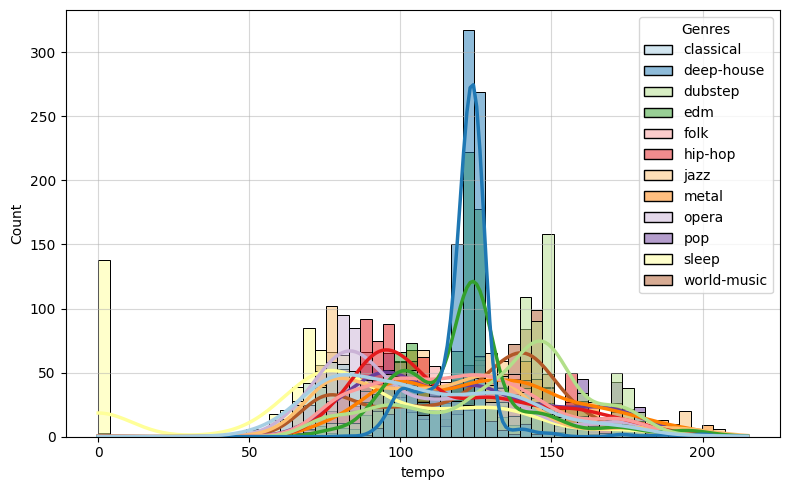

In [192]:
# Popularity #
# ---------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="popularity", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12), 
    legend_out=False
)
fig.tight_layout()

# Duration in milliseconds #
# ------------------------ #
fig, axes = plt.subplots(1,2, figsize=(10,4), gridspec_kw={'width_ratios': [4, 1]})
plot_genres_histogram(
    df=compact_nacho_dataset.query("duration_ms < 0.8e6"), 
    x="duration_ms", 
    hue="track_genre",
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    bins=100, 
    legend=True, 
    legend_out=False, 
    ax=axes[0]
)

plot_genres_histogram(
    df=compact_nacho_dataset.query("duration_ms >= 0.8e6"), 
    x="duration_ms", 
    hue="track_genre",
    labels=nacho_genres,
    palette=sns.color_palette("Paired", 12),
    bins=10, 
    multiple="dodge",
    legend=False, 
    ax=axes[1]
)
fig.tight_layout()

# Danceability #
# ------------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset,
    x="danceability", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    legend_side="left"
)
fig.tight_layout()

# Energy #
# ------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset,
    x="energy", 
    hue="track_genre",
    labels=nacho_genres,
    palette=sns.color_palette("Paired", 12)
)
fig.tight_layout()

# Key #
# --- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="key", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    discrete=True, 
    shrink=0.8
)
plt.xticks(np.arange(min(compact_nacho_dataset.key.unique()), max(compact_nacho_dataset.key.unique())+1, 1.0))
fig.tight_layout()

# Loudness #
# -------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="loudness", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    legend_out=False, 
    legend_side="left"
)
fig.tight_layout()

# Speechiness #
# ----------- #
fig, axes = plt.subplots(3,4, figsize=(24,12))
for i in range(3):
    for j in range(4):
        genre = nacho_genres[4*i+j]
        mini_dataset = compact_nacho_dataset[compact_nacho_dataset.track_genre == le_nacho_genre.transform([genre])[0]]
        ax = axes[i,j]
        
        hue_order = le_nacho_genre.transform(nacho_genres)
        palette = sns.color_palette("Paired", 12)
        hist_ax = sns.histplot(mini_dataset, x="speechiness", hue="track_genre", hue_order=hue_order, kde=True, palette=palette, ax=ax)
        ax.grid(alpha=0.5)
#         ax.set_title(f"Speechiness in {genre}")
        
        # Legend handling
        _legend = ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        ax.legend([_handles[nacho_genres.index(genre)]], [genre], loc="upper right")
fig.tight_layout()

# Acousticness #
# ------------ #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset,
    x="acousticness", 
    hue="track_genre", 
    labels=nacho_genres,
    palette=sns.color_palette("Paired", 12)
)
fig.tight_layout()

# Instrumentalness #
# ---------------- #
fig, axes = plt.subplots(3,4, figsize=(24,12))
for i in range(3):
    for j in range(4):
        genre = nacho_genres[4*i+j]
        mini_dataset = compact_nacho_dataset[compact_nacho_dataset.track_genre == le_nacho_genre.transform([genre])[0]]
        ax = axes[i,j]
        
        hue_order = le_nacho_genre.transform(nacho_genres)
        palette = palette=sns.color_palette("Paired", 12)
        hist_ax = sns.histplot(mini_dataset, x="instrumentalness", hue="track_genre", hue_order=hue_order, bins=200, kde=True, element='poly', palette=palette, ax=ax)
        ax.set_yscale('log')
        ax.grid(alpha=0.5)
#         ax.set_title(f"Instrumentalness in {genre}")
        
        # Legend handling
        _legend = ax.get_legend()
        _handles = _legend.legend_handles
        _legend.remove()
        ax.legend([_handles[nacho_genres.index(genre)]], [genre], loc="upper right")
fig.tight_layout()

# Liveness #
# -------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="liveness", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    legend_out=False
)
fig.tight_layout()

# Valence #
# ------- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="valence", 
    hue="track_genre", 
    labels=nacho_genres,
    palette=sns.color_palette("Paired", 12)
)
fig.tight_layout()

# Tempo #
# ----- #
fig = plt.figure(figsize=(8,5))
ax = plot_genres_histogram(
    df=compact_nacho_dataset, 
    x="tempo", 
    hue="track_genre", 
    labels=nacho_genres, 
    palette=sns.color_palette("Paired", 12),
    legend_out=False
)
fig.tight_layout()

# Training
---

## Splitting to Train and Test subsets
---

Now that all the data is clean, normalization is needed so it will run smoothly and with more accurate results. Then, It will finally be the time to train the model to identify genres by these given features!

In [18]:
[gtzan_train, gtzan_test] = train_test_split(compact_gtzan_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_gtzan_train = gtzan_train.drop("track_genre", axis=1)
y_gtzan_train = gtzan_train["track_genre"]

X_gtzan_test = gtzan_test.drop("track_genre", axis=1)
y_gtzan_test = gtzan_test["track_genre"]

In [19]:
[nacho_train, nacho_test] = train_test_split(compact_nacho_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_nacho_train = nacho_train.drop("track_genre", axis=1)
y_nacho_train = nacho_train["track_genre"]

X_nacho_test = nacho_test.drop("track_genre", axis=1)
y_nacho_test = nacho_test["track_genre"]

### [Random Forests](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier)
---

A better version of decision trees as it is containing the advantages of ensamble models. As we learned in AdaBoost, ensamble and boosting models use weights on the models themselves to get which basic models give better results and this way have more generalized yet accurate models.

With this model, we will also use tuning to seek for the best hyper-parameters to fit the model with for getting best results

RF_Compare Train Accuracy: 89.738%
RF_Compare Test Accuracy: 66.4%


Text(0.5, 1.0, 'Confusion Matrix of RF_Compare GTZAN on test set')

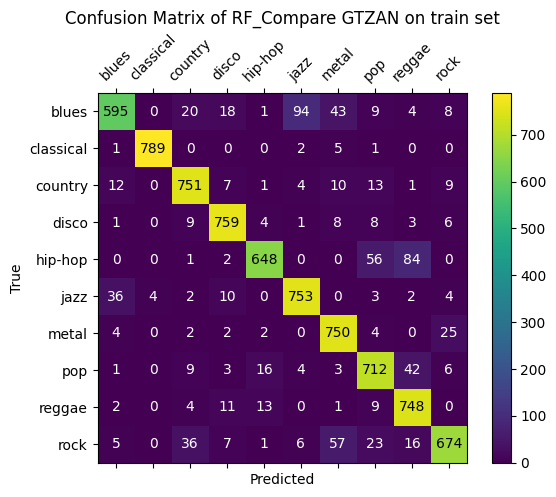

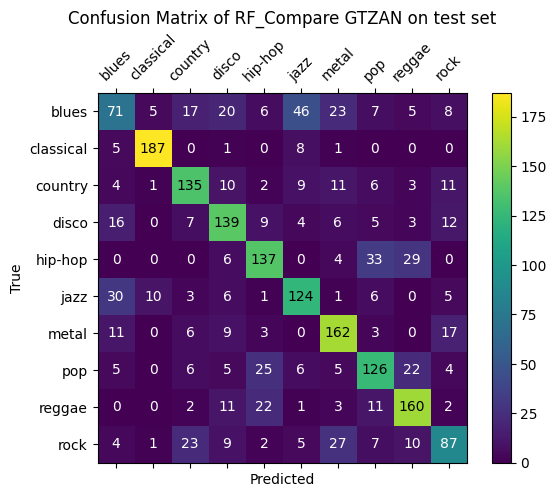

In [195]:
# RF_GTZAN
rf_compare_gtzan = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=73, max_depth=11, random_state=42))
])
rf_compare_gtzan.fit(X_gtzan_train, y_gtzan_train)

print(f"RF_Compare Train Accuracy: {round(rf_compare_gtzan.score(X_gtzan_train, y_gtzan_train) * 100, 3)}%")
print(f"RF_Compare Test Accuracy: {round(rf_compare_gtzan.score(X_gtzan_test, y_gtzan_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

fig11, ax11 = display_rf_confusion_matrix(rf_compare_gtzan, X_gtzan_train, y_gtzan_train, labels)
ax11.set_title("Confusion Matrix of RF_Compare GTZAN on train set")
fig12, ax12 = display_rf_confusion_matrix(rf_compare_gtzan, X_gtzan_test, y_gtzan_test, labels)
ax12.set_title("Confusion Matrix of RF_Compare GTZAN on test set")

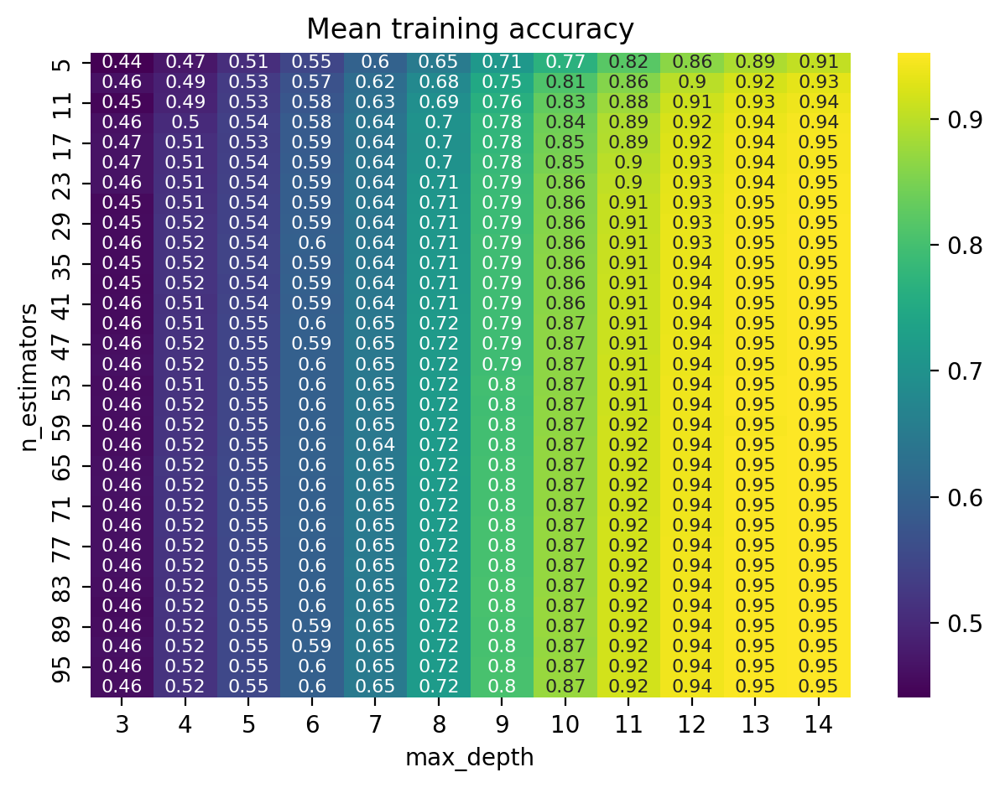

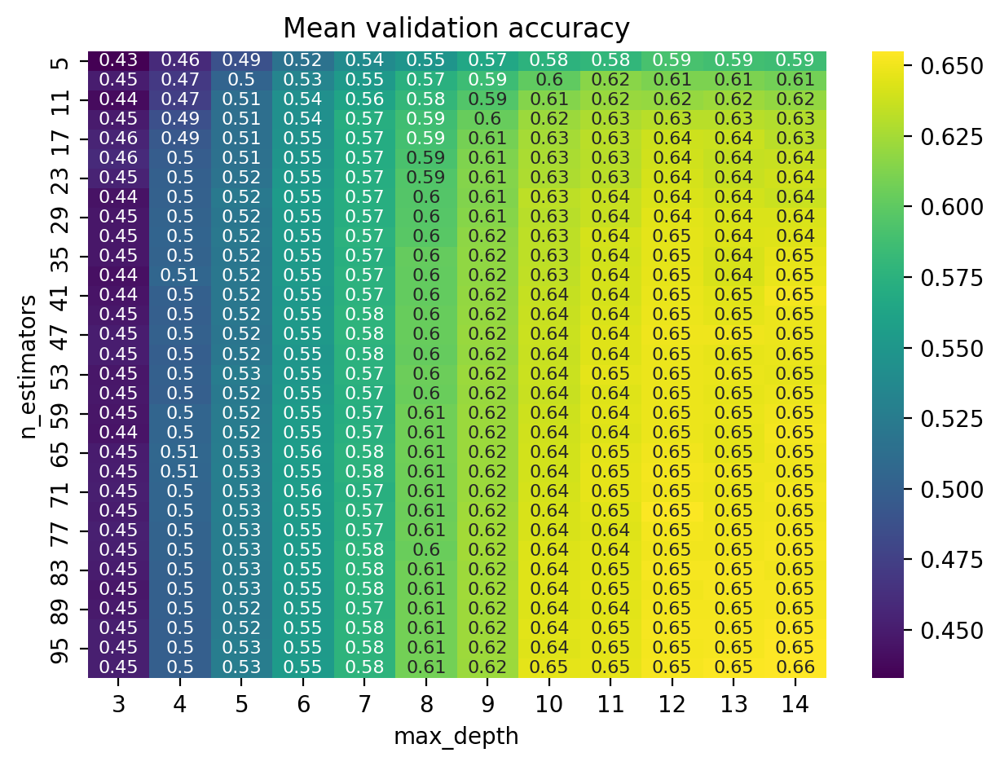

In [196]:
n_estimators = list(range(5, 100, 3))
max_depth = list(range(3,15))

train_and_plot_RF(X_gtzan_train, y_gtzan_train, n_estimators, max_depth, gs_save_path=".misc\\pickled_models\\GTZAN_BASIC_GS.pkl")

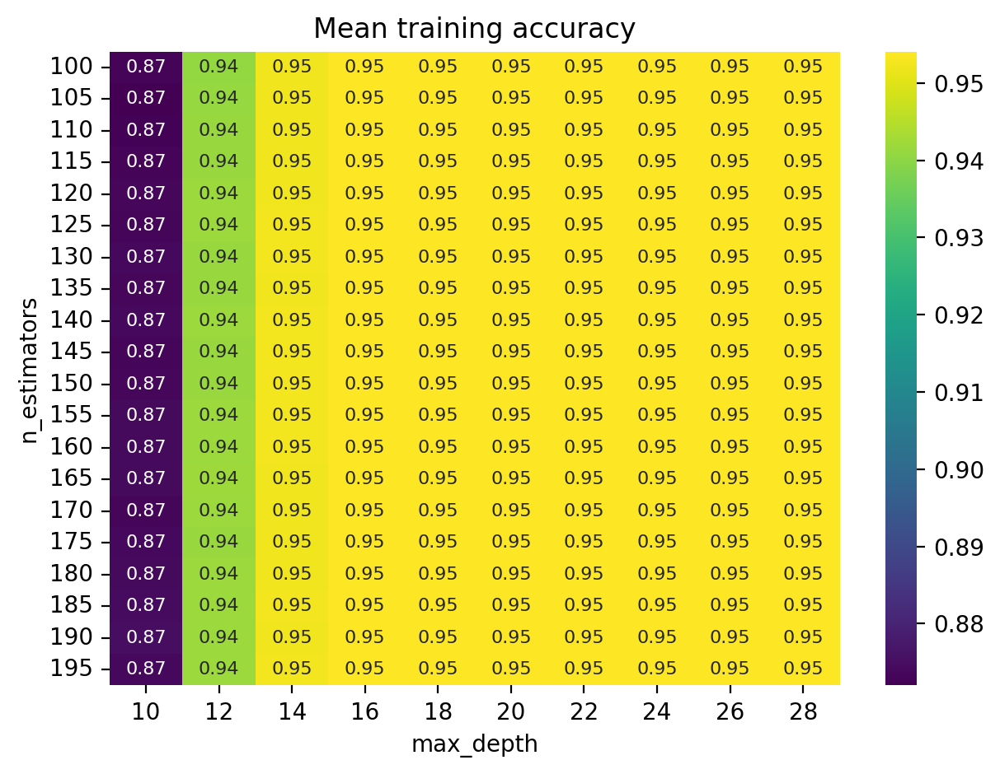

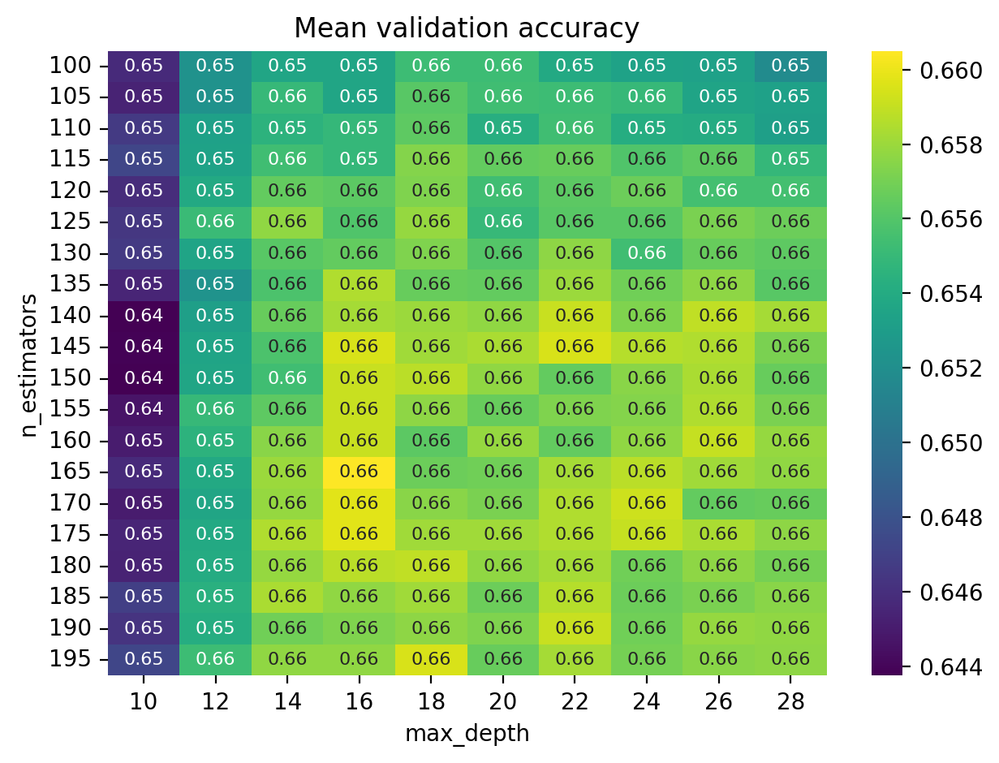

In [20]:
n_estimators = list(range(100, 200, 5))
max_depth = list(range(10, 30, 2))

train_and_plot_RF(X_gtzan_train, y_gtzan_train, n_estimators, max_depth, gs_save_path=".misc\\pickled_models\\GTZAN_BASIC2_GS.pkl")

The following block was to test the current dataset on the most accurate random forest I had this far which is rf_odg_1.

As expected there was barely matching, only 32% success.

RF1 Train Accuracy on Spotify Tracks Dataset: 32.54%


Text(0.5, 1.0, 'Confusion Matrix of RF1 on Spotify Tracks Dataset')

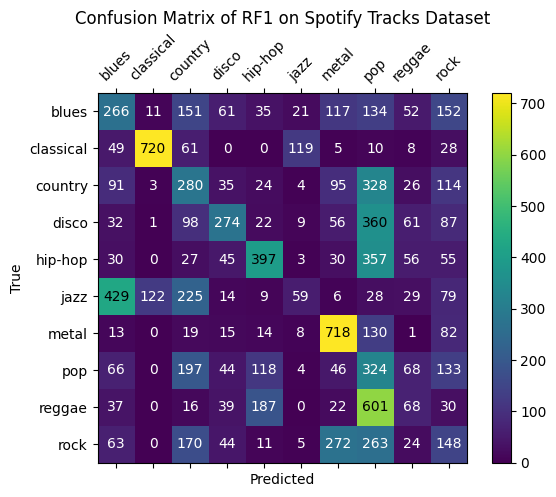

In [55]:
labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

X_st_gtzan_dataset = compact_gtzan_dataset.drop("track_genre", axis=1)
y_st_gtzan_dataset = compact_gtzan_dataset["track_genre"]
print(f"RF1 Train Accuracy on Spotify Tracks Dataset: {rf_ogd_1.score(X_st_gtzan_dataset, y_st_gtzan_dataset) * 100}%")

fig11, ax11 = display_rf_confusion_matrix(rf_ogd_1, X_st_gtzan_dataset, y_st_gtzan_dataset, labels)
ax11.set_title("Confusion Matrix of RF1 on Spotify Tracks Dataset")

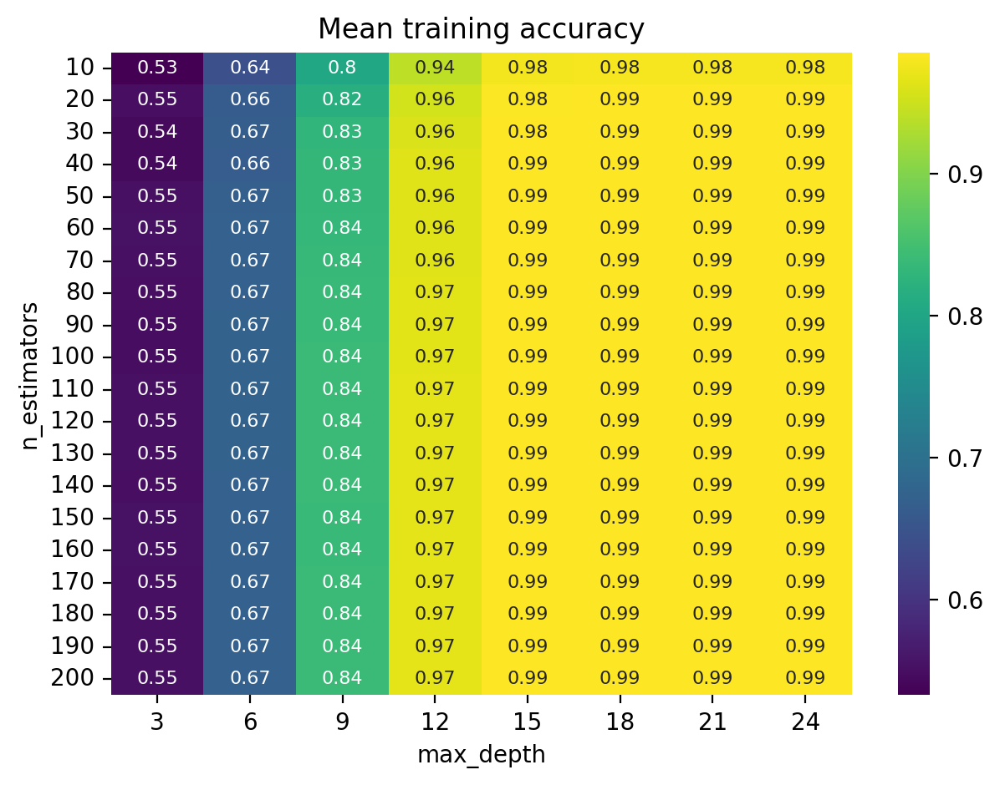

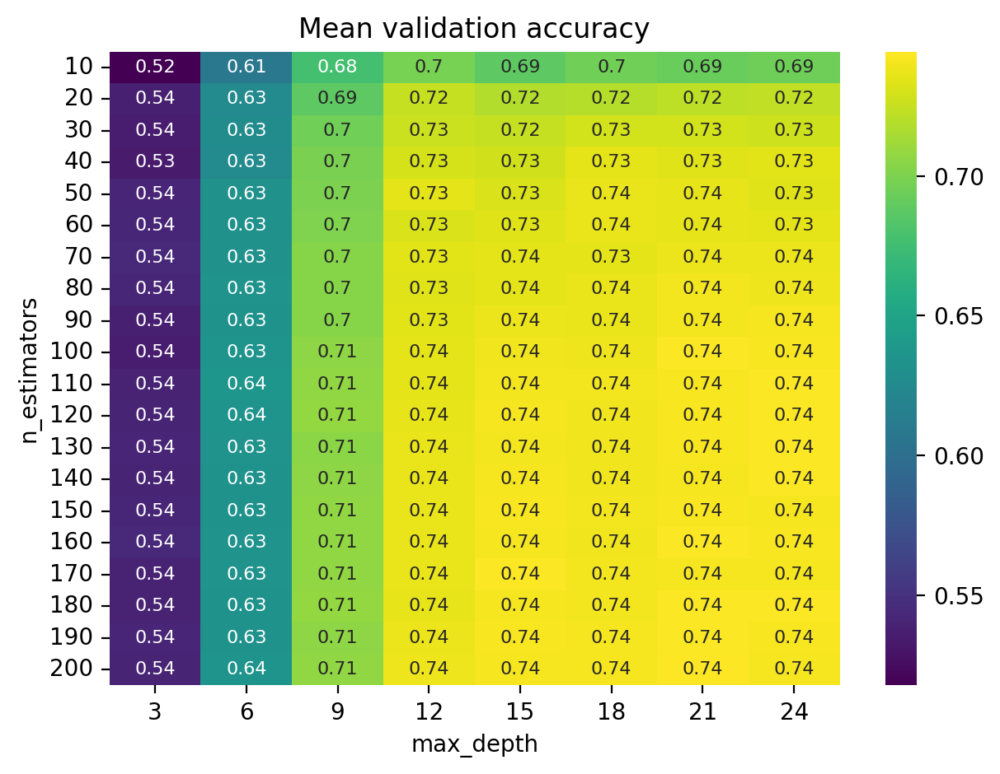

In [21]:
n_estimators = list(range(10, 201, 10))
max_depth = list(range(3, 25, 3))

train_and_plot_RF(X_nacho_train, y_nacho_train, n_estimators, max_depth, '.misc\\pickled_models\\NACHO_BASIC_GS.pkl')

Let us train two Random Forest models for the GTZAN Dataset:
1. `n_estimators = 50` and `max_depth = 6`. This RF model will have close predictions to the training, and should result more reliable predictions to the given accuracy
2. `n_estimators = 165` and `max_depth = 16`. This RF model is in the "overfitting" zone but validation says otherwise.

And let us train one Random Forest model for the NACHO Dataset (just for fun):

3. `n_estimators = 160` and `max_depth = 17`. This RF model is in the "overfitting" zone but validation says otherwise.

RF1 Train Accuracy: 58.862%
RF1 Test Accuracy: 55.85%


Text(0.5, 1.0, 'Confusion Matrix of RF1 GTZAN on test set')

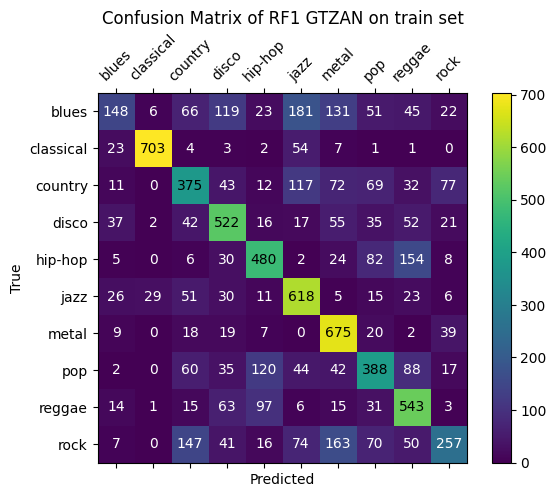

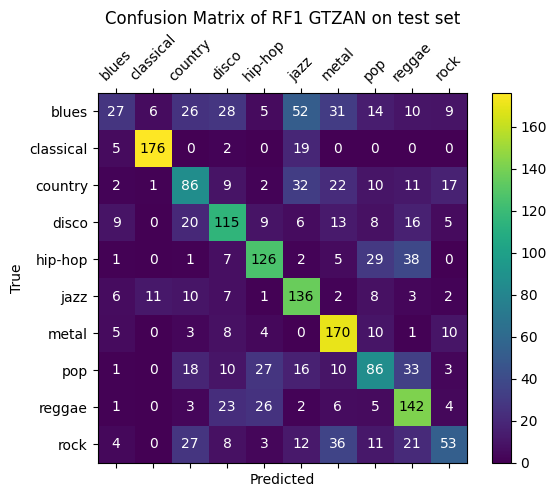

In [61]:
# RF1_GTZAN
rf1_gtzan = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=50, max_depth=6, random_state=42))
])
rf1_gtzan.fit(X_gtzan_train, y_gtzan_train)

print(f"RF1 Train Accuracy: {round(rf1_gtzan.score(X_gtzan_train, y_gtzan_train) * 100, 3)}%")
print(f"RF1 Test Accuracy: {round(rf1_gtzan.score(X_gtzan_test, y_gtzan_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

fig11, ax11 = display_rf_confusion_matrix(rf1_gtzan, X_gtzan_train, y_gtzan_train, labels)
ax11.set_title("Confusion Matrix of RF1 GTZAN on train set")
fig12, ax12 = display_rf_confusion_matrix(rf1_gtzan, X_gtzan_test, y_gtzan_test, labels)
ax12.set_title("Confusion Matrix of RF1 GTZAN on test set")

RF2 Train Accuracy: 94.65%
RF2 Test Accuracy: 65.85%


Text(0.5, 1.0, 'Confusion Matrix of RF2 GTZAN on test set')

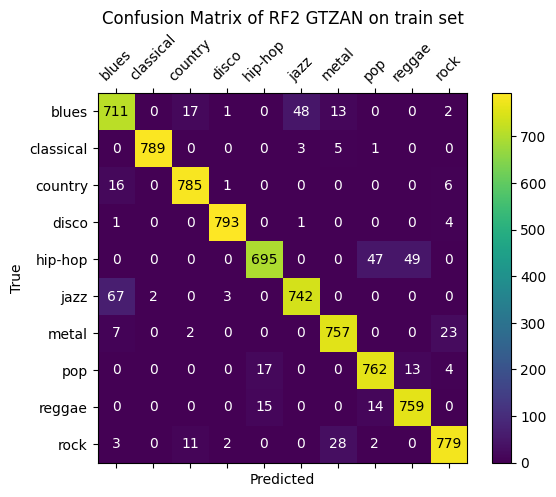

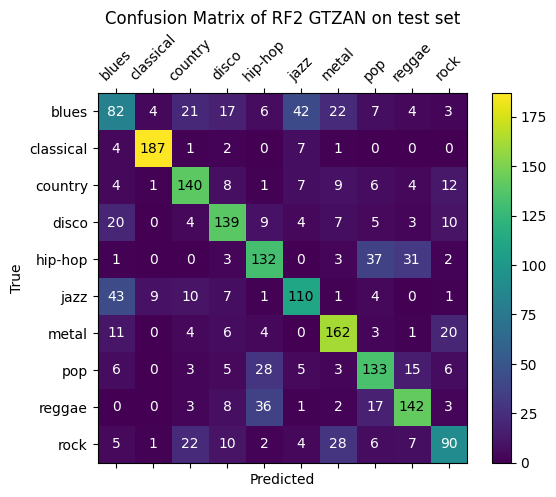

In [62]:
#RF2_GTZAN
rf2_gtzan = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=165, max_depth=16, random_state=42))
])
rf2_gtzan.fit(X_gtzan_train, y_gtzan_train)

print(f"RF2 Train Accuracy: {round(rf2_gtzan.score(X_gtzan_train, y_gtzan_train) * 100, 3)}%")
print(f"RF2 Test Accuracy: {round(rf2_gtzan.score(X_gtzan_test, y_gtzan_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

fig21, ax21 = display_rf_confusion_matrix(rf2_gtzan, X_gtzan_train, y_gtzan_train, labels)
ax21.set_title("Confusion Matrix of RF2 GTZAN on train set")
fig22, ax22 = display_rf_confusion_matrix(rf2_gtzan, X_gtzan_test, y_gtzan_test, labels)
ax22.set_title("Confusion Matrix of RF2 GTZAN on test set")

In [63]:
print_features_importance(rf2_gtzan["random_forest"], list(X_gtzan_train.columns))

Variable: acousticness         Importance: 0.14
Variable: danceability         Importance: 0.12
Variable: popularity           Importance: 0.11
Variable: energy               Importance: 0.1
Variable: loudness             Importance: 0.09
Variable: speechiness          Importance: 0.08
Variable: duration_ms          Importance: 0.07
Variable: instrumentalness     Importance: 0.07
Variable: valence              Importance: 0.06
Variable: tempo                Importance: 0.06
Variable: liveness             Importance: 0.05
Variable: key                  Importance: 0.03
Variable: explicit             Importance: 0.01
Variable: mode                 Importance: 0.01


This was the second part of the sub experiment with crossing datasets and getting to see the results. To my surprise and disappointment, this was NOT what I was expected and it failed to impress me with high accuracy. 😭

RF2 Accuracy on Original GTZAN Dataset: 39.61187214611872%


Text(0.5, 1.0, 'Confusion Matrix of RF2 on Original GTZAN Dataset')

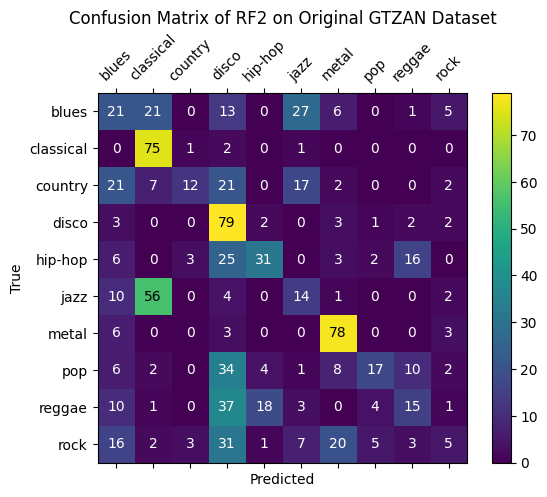

In [65]:
labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

X_ogd_dataset = original_gtzan_dataset.drop("track_genre", axis=1)
y_ogd_dataset = original_gtzan_dataset["track_genre"]
print(f"RF2 Accuracy on Original GTZAN Dataset: {rf2_gtzan.score(X_ogd_dataset, y_ogd_dataset) * 100}%")

fig11, ax11 = display_rf_confusion_matrix(rf2_gtzan, X_ogd_dataset, y_ogd_dataset, labels)
ax11.set_title("Confusion Matrix of RF2 on Original GTZAN Dataset")

In [ ]:
#RF1_NACHO
rf1_nacho = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=165, max_depth=17, random_state=42))
])
rf1_nacho.fit(X_nacho_train, y_nacho_train)

print(f"RF1 NACHO Train Accuracy: {round(rf1_nacho.score(X_nacho_train, y_nacho_train) * 100, 3)}%")
print(f"RF1 NACHO Test Accuracy: {round(rf1_nacho.score(X_nacho_test, y_nacho_test) * 100, 3)}%")

labels = list(le_nacho_genre.inverse_transform(range(len(nacho_genres))))

fig21, ax21 = display_rf_confusion_matrix(rf1_nacho, X_nacho_train, y_nacho_train, labels)
ax21.set_title("Confusion Matrix of RF1 NACHO on train set")
fig22, ax22 = display_rf_confusion_matrix(rf1_nacho, X_nacho_test, y_nacho_test, labels)
ax22.set_title("Confusion Matrix of RF1 NACHO on test set")

In [ ]:
print_features_importance(rf1_nacho["random_forest"], list(X_nacho_train.columns))

So far the best model there is, has 66% accuracy in its prediction. To train a good model a few changes can occur:
1. Add more features to the dataset:
    - Spotify has more data for each song in its database, such as audio analysis which gives a lot more details in different parts of the song
    - Spotify also provides with links to wav files of the song sample and images of the song's album. These type of data can contain further more interesting ways to analyze, and perhaps finding connections to the genres.
    - Another direction to consider is through the lyrics of songs. Tho not all songs has lyrics we can try to find connections to themes provided in songs, language, text structure and more, to the genres available.
    
2. Explore the possibility to use Neural Network to find hidden, and non-intuitive connections between existing features and also future added features:
    - One direction to be considered is the fact that some of the new features are time dependednt, meaning training an RNN model might be ideal for this type of data as it might find even better connections to the genre, and it might find them more intuitively so we can understant them better, later when the model is ready and gained a good accuracy.

## 1. Add more featuers to the dataset
---
The first try is to add more features to the dataset, The features are called bars, beats, tatums, sections and segments and these are just the count of each feature in the audio_analysis.json file.

### Count Features
---

In [54]:
process_audio_analysis_to_N_sections(7)

In [56]:
count_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_count_analysis.json"), 'r', encoding='utf-8') as infile:
        count_analysis = json.load(infile)
    
    count_analysis["Unnamed: 0"] = sample["Unnamed: 0"]
    count_dataset.append(count_analysis)

count_df = pd.DataFrame(count_dataset)

In [ ]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_count_dataset = gtzan_count_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_count_dataset.explicit = le_explicit.fit_transform(gtzan_count_dataset.explicit)

le_genre = preprocessing.LabelEncoder()
gtzan_count_dataset.track_genre = le_genre.fit_transform(gtzan_count_dataset.track_genre)

gtzan_count_dataset.info()

In [ ]:
[count_train, count_test] = train_test_split(gtzan_count_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_count_train = count_train.drop("track_genre", axis=1)
y_count_train = count_train["track_genre"]

X_count_test = count_test.drop("track_genre", axis=1)
y_count_test = count_test["track_genre"]

In [ ]:
n_estimators = list(range(130, 180, 5))
max_depth = list(range(20, 28, 2))

train_and_plot_RF(X_count_train, y_count_train, n_estimators, max_depth)

In [ ]:
#RF3
rf3 = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=145, max_depth=22, random_state=42))
])
rf3.fit(X_count_train, y_count_train)

print(f"RF3 Train Accuracy: {round(rf3.score(X_count_train, y_count_train) * 100, 3)}%")
print(f"RF3 Test Accuracy: {round(rf3.score(X_count_test, y_count_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

fig21, ax21 = display_rf_confusion_matrix(rf3, X_count_train, y_count_train, labels)
ax21.set_title("Confusion Matrix of RF3 on train set")
fig22, ax22 = display_rf_confusion_matrix(rf3, X_count_test, y_count_test, labels)
ax22.set_title("Confusion Matrix of RF3 on test set")

In [ ]:
print_features_importance(rf3["random_forest"], list(X_count_train.columns))

### Sections and Segments Features: First try -> Straight Forward
---

The second try is to add analyzed data about the sections mentioned in audio analysis. The problem with the raw data of this audio analysis is the fact that each song has different number of sections. So to make it more uniform dataset, an averaging algorithm was constructed to make it to have similar number of sections for every song.

#### 1000 `sections`
---
Each section has 7 parameters and therefore the amount of features total added are the number of sections multiplied by 7. The next runs were on a dataset (which no longer exists but can be recreate again if needed) where each song had 1000 sections totaling 7020 features (including the previously added features).

Be sure to delete any file that have the regex pattern `audio_s.*\.json` before, as I didn't added auto delete of previous files because there were times that the process stopped in the middle and I didn't want to start over all the files again.

In [ ]:
process_audio_analysis_to_N_sections(1000)

In [59]:
sections_analysis_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        continue
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_sections_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_sections_analysis = json.load(infile)
    
    sections_analysis = {}
    for i in range(len(raw_sections_analysis)):
        for key, value in raw_sections_analysis[i].items():
            sections_analysis[f"{key}_{i}"] = value
    
    sections_analysis["Unnamed: 0"] = sample["Unnamed: 0"]
    sections_analysis_dataset.append(sections_analysis)

sections_1000_analysis_df = pd.DataFrame(sections_analysis_dataset)

In [ ]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_sections_1000_dataset = pd.merge(left=sections_1000_analysis_df, right=gtzan_count_dataset, on="Unnamed: 0")
gtzan_sections_1000_dataset = gtzan_sections_1000_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_sections_1000_dataset.explicit = le_explicit.fit_transform(gtzan_sections_1000_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
gtzan_sections_1000_dataset.track_genre = le_gtzan_genre.fit_transform(gtzan_sections_1000_dataset.track_genre)

gtzan_sections_1000_dataset.info()

In [ ]:
[sections_1000_train, sections_1000_test] = train_test_split(gtzan_sections_1000_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_sections_1000_train = sections_1000_train.drop("track_genre", axis=1)
y_sections_1000_train = sections_1000_train["track_genre"]

X_sections_1000_test = test.drop("track_genre", axis=1)
y_sections_1000_test = test["track_genre"]

In [ ]:
n_estimators = list(range(500, 800, 50))
max_depth = list(range(30, 50, 5))

train_and_plot_RF(X_sections_1000_train, y_sections_1000_train, n_estimators, max_depth)

In [ ]:
n_estimators = [50, 70, 90, 110, 250, 300, 400, 500]
max_depth = list(range(10, 20))

train_and_plot_RF(X_sections_1000_train, y_sections_1000_train, n_estimators, max_depth)

#### 10 `sections`
---

Seeing this has given the dataset a lot of noise and therefore decreasing the accuracy of it, it was decided to make a small sections dataset, and this time, it has only 10 sections for each song. (Again, the data is no longer exists, but it is a code to run to recreate it againn)

Be sure to delete any file that have the regex pattern `audio_s.*\.json` before, as I didn't added auto delete of previous files because there were times that the process stopped in the middle and I didn't want to start over all the files again.

In [ ]:
process_audio_analysis_to_N_sections(10)

In [ ]:
sections_analysis_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_sections_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_sections_analysis = json.load(infile)
    
    sections_analysis = {}
    for i in range(len(raw_sections_analysis)):
        for key, value in raw_sections_analysis[i].items():
            sections_analysis[f"{key}_{i}"] = value
    
    sections_analysis["Unnamed: 0"] = sample["Unnamed: 0"]
    sections_analysis_dataset.append(sections_analysis)

sections_10_analysis_df = pd.DataFrame(sections_analysis_dataset)

In [ ]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_sections_10_dataset = pd.merge(left=sections_10_analysis_df, right=gtzan_count_dataset, on="Unnamed: 0")
gtzan_sections_10_dataset = gtzan_sections_10_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_sections_10_dataset.explicit = le_explicit.fit_transform(gtzan_sections_10_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
gtzan_sections_10_dataset.track_genre = le_gtzan_genre.fit_transform(gtzan_sections_10_dataset.track_genre)

gtzan_sections_10_dataset.info()

In [ ]:
[sections_10_train, sections_10_test] = train_test_split(gtzan_sections_10_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_sections_10_train = sections_10_train.drop("track_genre", axis=1)
y_sections_10_train = sections_10_train["track_genre"]

X_sections_10_test = sections_10_test.drop("track_genre", axis=1)
y_sections_10_test = sections_10_test["track_genre"]

In [ ]:
n_estimators = list(range(100, 201, 10))
max_depth = list(range(4, 31, 2))

train_and_plot_RF(X_sections_10_train, y_sections_10_train, n_estimators, max_depth)

#### 20 `segments`
---

As we can see, the features that were added to the dataset were doing any good, and therefore we might give up on them, if there won't be any use in RNN in the future where the neural network will remember the previous steps... Or any model that can remember.

Now we move on to the features of timbre and pitch\

Be sure to delete any file that have the regex pattern `audio_s.*\.json` before, as I didn't added auto delete of previous files because there were times that the process stopped in the middle and I didn't want to start over all the files again.

In [ ]:
process_audio_analysis_to_N_sections(20)

In [ ]:
segments_analysis_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_segments_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_segments_analysis = json.load(infile)
    
    segments_analysis = {}
    for i in range(len(raw_segments_analysis)):
        for j in range(len(raw_segments_analysis[i]["pitches"])):
            segments_analysis[f"pitch_{i}_{j}"] = raw_segments_analysis[i]["pitches"][j]
        for j in range(len(raw_segments_analysis[i]["timbre"])):
            segments_analysis[f"timbre_{i}_{j}"] = raw_segments_analysis[i]["timbre"][j]
    
    segments_analysis["Unnamed: 0"] = sample["Unnamed: 0"]
    segments_analysis_dataset.append(segments_analysis)

segments_analysis_df = pd.DataFrame(segments_analysis_dataset)

In [ ]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_segments_20_dataset = pd.merge(left=segments_analysis_df, right=gtzan_count_dataset, on="Unnamed: 0")
gtzan_segments_20_dataset = gtzan_segments_20_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_segments_20_dataset.explicit = le_explicit.fit_transform(gtzan_segments_20_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
gtzan_segments_20_dataset.track_genre = le_gtzan_genre.fit_transform(gtzan_segments_20_dataset.track_genre)

gtzan_segments_20_dataset.info()

In [ ]:
[segments_20_train, segments_20_test] = train_test_split(gtzan_segments_20_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_segments_20_train = segments_20_train.drop("track_genre", axis=1)
y_segments_20_train = segments_20_train["track_genre"]

X_segments_20_test = segments_20_test.drop("track_genre", axis=1)
y_segments_20_test = segments_20_test["track_genre"]

In [ ]:
n_estimators = list(range(100, 201, 10))
max_depth = list(range(4, 31, 2))

train_and_plot_RF(X_segments_20_train, y_segments_20_train, n_estimators, max_depth)

As we can see, there is not much room for improvement in the aspects of features using Random Forest model. Let's see if there are first better results (over 66% in accuracy) When running the basic dataset on a neural network model.

This segment was not mentioned in the report, so if you want, you may skip it as it is just a self check that Random Forest models are better for this dataset as well.

In [64]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_count_dataset = gtzan_count_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_count_dataset.explicit = le_explicit.fit_transform(gtzan_count_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
gtzan_count_dataset.track_genre = le_gtzan_genre.fit_transform(gtzan_count_dataset.track_genre)

# Normalizations
for column in gtzan_count_dataset.drop("track_genre", axis=1).columns:
    scaler = preprocessing.MinMaxScaler()
    gtzan_count_dataset[column] = scaler.fit_transform(gtzan_count_dataset[[column]])

gtzan_count_dataset.head()

,bars,beats,tatums,sections,segments,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,track_genre
0,0.290000,0.291702,0.291702,0.218182,0.673661,0.927711,0.329771,0.0,0.871944,0.526031,0.909091,0.699648,0.0,0.116022,0.411548,0.051337,0.017092,0.596939,0.464579,0
1,0.246667,0.185666,0.185666,0.090909,0.205861,0.879518,0.153531,0.0,0.622817,0.580843,0.090909,0.893187,1.0,0.040884,0.535273,0.000002,0.095630,0.486735,0.558282,0
2,0.160000,0.162196,0.162196,0.072727,0.183068,0.891566,0.110367,0.0,0.830035,0.678647,0.181818,0.924317,0.0,0.034586,0.756572,0.000000,0.057551,0.752041,0.610719,0
3,0.318333,0.322716,0.322716,0.236364,0.748191,0.710843,0.368402,0.0,0.563446,0.957010,0.000000,0.968648,1.0,0.181215,0.366282,0.000000,0.061013,0.693878,0.445946,0
4,0.270000,0.269908,0.269908,0.236364,0.385311,0.674699,0.247189,0.0,0.778813,0.538928,0.818182,0.827056,0.0,0.030608,0.495037,0.000276,0.049546,0.383673,0.557434,0


In [ ]:
[count_train, count_test] = train_test_split(gtzan_count_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_count_train = count_train.drop("track_genre", axis=1)
y_count_train = count_train["track_genre"]

X_count_test = count_test.drop("track_genre", axis=1)
y_count_test = count_test["track_genre"]

In [ ]:
model = keras.Sequential([
    Input(name = "input", shape = (X_train.shape[1])),
    Dense(256, activation = "relu"),
    BatchNormalization(),
    Dropout(0.2),
    Dense(128, activation = "relu"),
    Dense(128, activation = "relu"),
    BatchNormalization(),
    Dropout(0.2),
    Dense(64, activation = "relu"),
    Dense(units=len(gtzan_genres), activation='softmax')
])

early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss", 
                                               patience = 10, restore_best_weights = True)
early_stopping2 = keras.callbacks.EarlyStopping(monitor = "val_accuracy", 
                                               patience = 10, restore_best_weights = True)

model.compile(optimizer=keras.optimizers.RMSprop(0.01), 
              loss=keras.losses.SparseCategoricalCrossentropy(), 
              metrics=[keras.metrics.SparseCategoricalAccuracy(),
                       "accuracy"])

In [ ]:
model_history = model.fit(X_count_train, y_count_train,
                          epochs = 100,
                          verbose = 1, batch_size = 128,
                          validation_data = (X_count_test, y_count_test),
                          callbacks = [early_stopping1, early_stopping2])

In [ ]:
plt.plot(model_history.history["loss"])
plt.plot(model_history.history["val_loss"])
plt.legend(["loss", "validation loss"], loc ="upper right")
plt.title("Train and Validation Loss")
plt.xlabel("epoch")
plt.ylabel("Sparse Categorical Cross Entropy")
plt.show()

As we can see, a Random Forest with this dataset can get us a better accuracy than a neural network. Of course it is depends on the neural network structure, but still...

The next step will be to use the RNN special features and abilities to train better fit then use the resulted prediction as inputs to get better results in the random forest. This way we get to use the information with the idea that some of the features are sequential and should result better accuracies when memorizing the connections.

### Sections and Segments: Second Try -> Reccuring Neural Network
---

#### 250 `sections`
---
The following code has taken into consideration the fact that sections of each song was stretched/shrunked to 250 parts, each containing 7 features. So the final RNN will run a cycle of 250 timesteps each will recieve 7 features. so the shape of the dataset should be np.array([]).shape = (10000, 250, 7). Let's define this dataset.

In [ ]:
X = []
y = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_sections_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_sections_analysis = json.load(infile)
    
    sections_analysis = []
    for section in raw_sections_analysis:
        sections_analysis.append(list(section.values()))
    
    X.append(sections_analysis)
    y.append(track_genre)
    
X = np.array(X)

le_genre = preprocessing.LabelEncoder()
y = le_genre.fit_transform(y)
y = np.eye(len(gtzan_genres))[y]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 0.7, test_size= 0.3, random_state=42, shuffle = True)

# Normalizations
for i in range(X_train.shape[2]):
    
    scaler = preprocessing.MinMaxScaler()
    
    min_val = np.min(X_train[:,:,i])
    max_val = np.max(X_train[:,:,i])
    
    X_train[:,:,i] = scaler.fit_transform(X_train[:,:,i].reshape(-1, 1), (min_val, max_val)).reshape(X_train[:,:,i].shape)
    X_test[:,:,i] = scaler.transform(X_test[:,:,i].reshape(-1, 1)).reshape(X_test[:,:,i].shape)

X_test, X_validation, y_test, y_validation = train_test_split(X, y, train_size= 0.5, test_size= 0.5, random_state=42, shuffle = True)

In [ ]:
rnn_model = keras.Sequential([
    LSTM(units = 64, return_sequences=True, input_shape = (X_train.shape[1], X_train.shape[2])),
    Dropout(0.1),
    LSTM(units = 64, return_sequences=True),
    Dropout(0.1),
    LSTM(units = 64),
    Dense(units=len(gtzan_genres), activation='softmax')
])

early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss", patience = 20, restore_best_weights = True)

rnn_model.compile(optimizer=keras.optimizers.Adam(),
                  loss=keras.losses.CategoricalCrossentropy(),
                  metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
rnn_model.summary()

In [ ]:
model_history = rnn_model.fit(X_train, y_train,
                              epochs = 100,
                              verbose = 1, 
                              batch_size = 32,
                              validation_data = (X_validation, y_validation),
                              callbacks = [early_stopping1])

As it seem, there is not much of a connections between sections and genres and therefore we will leave the idea of it alone.

#### 250 `segments`
---

The next blocks are to find a neural network that will work good on the segments infomation, this one is not mentioned in the report as well so you can more on some more blocks

In [ ]:
X = []
y = []

segments_analysis_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_segments_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_segments_analysis = json.load(infile)
    
    segments_analysis = []
    for segment in raw_segments_analysis:
        segments_analysis.append(segment["pitches"] + segment["timbre"])
    
    X.append(segments_analysis)
    y.append(track_genre)
    
X = np.array(X)

le_genre = preprocessing.LabelEncoder()
y = le_genre.fit_transform(y)
y = np.eye(len(gtzan_genres))[y]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 0.7, test_size= 0.3, random_state=42, shuffle = True)

# Normalizations
for i in range(X_train.shape[2]):
    
    scaler = preprocessing.MinMaxScaler()
    
    min_val = np.min(X_train[:,:,i])
    max_val = np.max(X_train[:,:,i])
    
    X_train[:,:,i] = scaler.fit_transform(X_train[:,:,i].reshape(-1, 1), (min_val, max_val)).reshape(X_train[:,:,i].shape)
    X_test[:,:,i] = scaler.transform(X_test[:,:,i].reshape(-1, 1)).reshape(X_test[:,:,i].shape)

X_test, X_validation, y_test, y_validation = train_test_split(X, y, train_size= 0.5, test_size= 0.5, random_state=42, shuffle = True)

In [ ]:
initializer = keras.initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=42)

rnn_model = keras.Sequential([
    Bidirectional(
        LSTM(
            units = 64,
            return_sequences = True,
            input_shape = (X_train.shape[1], X_train.shape[2]),
            kernel_initializer = initializer
        )
    ),
    
    Dropout(0.1),
    
    Bidirectional(
        LSTM(
            units = 64, 
            return_sequences = True,
            kernel_initializer = initializer
        )
    ),
    
    Dropout(0.2),
    
    Bidirectional(
        LSTM(
            units = 64,
            kernel_initializer = initializer
        )
    ),
    
    Dropout(0.1),
    
    Dense(
        units = len(gtzan_genres), 
        activation='softmax'
    )
])

early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss", 
                                               patience = 10, restore_best_weights = True)

rnn_model.compile(optimizer=keras.optimizers.RMSprop(0.001),
                  loss=keras.losses.CategoricalCrossentropy(),
                  metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
model_history = rnn_model.fit(X_train, y_train,
                              epochs = 100,
                              verbose = 1, 
                              batch_size = 32,
                              validation_data = (X_validation, y_validation),
                              callbacks = [early_stopping1])

In [ ]:
labels = list(le_genre.inverse_transform(range(len(gtzan_genres))))

fig11, ax11 = display_categorical_nn_confusion_matrix(rnn_model, X_train, y_train, labels)
ax11.set_title("Confusion Matrix of RNN on Segments on train set")
fig12, ax12 = display_categorical_nn_confusion_matrix(rnn_model, X_test, y_test, labels)
ax12.set_title("Confusion Matrix of RNN on Segments on test set")

In [ ]:
rnn_model.save(".misc\\pickled_models\\segments1.h5")

#### 250 of both segments and sections
---
This is the real take that was reported in the documnet.

In [ ]:
indices = []
X = []
y = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError

    with open(os.path.join(local_track_folder, "audio_segments_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_segments_analysis = json.load(infile)
        
    with open(os.path.join(local_track_folder, "audio_sections_analysis.json"), 'r', encoding='utf-8') as infile:
        raw_sections_analysis = json.load(infile)
    
    audio_analysis = []
    for section, segment in zip(raw_sections_analysis, raw_segments_analysis):
        audio_analysis.append(list(section.values()) + segment["pitches"] + segment["timbre"])
    
    indices.append(sample["Unnamed: 0"])
    X.append(audio_analysis)
    y.append(track_genre)
    
X = np.array(X)

le_genre = preprocessing.LabelEncoder()
y = le_genre.fit_transform(y)
y = np.eye(len(gtzan_genres))[y]

audio_analysis_dataset = {"Unnamed: 0":indices, "X":X, "y":y}

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 0.7, test_size= 0.3, random_state=42, shuffle = True)

# Normalizations
for i in range(X_train.shape[2]):
    
    scaler = preprocessing.MinMaxScaler()
    
    min_val = np.min(X_train[:,:,i])
    max_val = np.max(X_train[:,:,i])
    
    X_train[:,:,i] = scaler.fit_transform(X_train[:,:,i].reshape(-1, 1), (min_val, max_val)).reshape(X_train[:,:,i].shape)
    X_test[:,:,i] = scaler.transform(X_test[:,:,i].reshape(-1, 1)).reshape(X_test[:,:,i].shape)

X_test, X_validation, y_test, y_validation = train_test_split(X, y, train_size= 0.5, test_size= 0.5, random_state=42, shuffle = True)

In [ ]:
rnn_model = keras.Sequential([
    Bidirectional(
        LSTM(
            units = 32,
            return_sequences = True,
            input_shape = (X_train.shape[1], X_train.shape[2]),
            kernel_initializer = keras.initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=42)
        )
    ),
    
    Dropout(0.1),
    
    Bidirectional(
        LSTM(
            units = 64, 
            return_sequences = True,
            kernel_initializer = keras.initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=42)
        )
    ),
    
    Dropout(0.1),
    
    Bidirectional(
        LSTM(
            units = 64, 
            return_sequences = True,
            kernel_initializer = keras.initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=42)
        )
    ),
    
    Dropout(0.2),
    
    Bidirectional(
        LSTM(
            units = 32,
            kernel_initializer = keras.initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=42)
        )
    ),
    
    Dropout(0.1),
    
    Dense(
        units = len(gtzan_genres), 
        activation='softmax'
    )
])

early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss", 
                                               patience = 15, restore_best_weights = True)

rnn_model.compile(optimizer=keras.optimizers.RMSprop(),
                  loss=keras.losses.CategoricalCrossentropy(),
                  metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
model_history = rnn_model.fit(X_train, y_train,
                              epochs = 100,
                              verbose = 1, 
                              batch_size = 64,
                              validation_data = (X_validation, y_validation),
                              callbacks = [early_stopping1])

In [ ]:
labels = list(le_genre.inverse_transform(range(len(gtzan_genres))))

fig11, ax11 = display_categorical_nn_confusion_matrix(rnn_model, X_train, y_train, labels)
ax11.set_title("Confusion Matrix of RNN on Segments on train set")
fig12, ax12 = display_categorical_nn_confusion_matrix(rnn_model, X_test, y_test, labels)
ax12.set_title("Confusion Matrix of RNN on Segments on test set")

In [ ]:
rnn_model.save(".misc\\pickled_models\\secmengts1.h5")

If you don't want to wait an hour for the model to be trained, load the trained one from the files! (Only the next row)

In [ ]:
rnn_model = keras.saving.load_model(".misc\\pickled_models\\secmengts1.h5")

The next blocks are training a random forest with all the information according to a trained RNN

In [ ]:
audio_analysis_dataset["rnn_model_analysis"] = rnn_model.predict(audio_analysis_dataset["X"])

In [ ]:
rnn_model_dataset_dict = {"Unnamed: 0": audio_analysis_dataset["Unnamed: 0"]}
for i in range(len(gtzan_genres)):
    rnn_model_dataset_dict[f"{gtzan_genres[i]}_probability"] = audio_analysis_dataset["rnn_model_analysis"][:, i]

rnn_model_df = pd.DataFrame(rnn_model_dataset_dict)

In [ ]:
rnn_model_df.info()

In [ ]:
extended_gtzan_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
extended_gtzan_dataset = pd.merge(left=rnn_model_df, right=extended_gtzan_dataset, on="Unnamed: 0")
extended_gtzan_dataset = extended_gtzan_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
extended_gtzan_dataset.explicit = le_explicit.fit_transform(extended_gtzan_dataset.explicit)

le_genre = preprocessing.LabelEncoder()
extended_gtzan_dataset.track_genre = le_genre.fit_transform(extended_gtzan_dataset.track_genre)

extended_gtzan_dataset.info()

In [ ]:
[train, test] = train_test_split(extended_gtzan_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_gtzan_train = train.drop("track_genre", axis=1)
y_gtzan_train = train["track_genre"]

X_gtzan_test = test.drop("track_genre", axis=1)
y_gtzan_test = test["track_genre"]

In [ ]:
n_estimators = list(range(1, 300, 15))
max_depth = list(range(4, 20, 2))

train_and_plot_RF(X_gtzan_train, y_gtzan_train, n_estimators, max_depth, "Pickle/SecSegNN_GS(2).pkl")

In [ ]:
#RF_RNN_GTZAN
rf_rnn_gtzan = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=100, max_depth=14, random_state=42))
])
rf_rnn_gtzan.fit(X_gtzan_train, y_gtzan_train)

print(f"RF_RNN Train Accuracy: {round(rf_rnn_gtzan.score(X_gtzan_train, y_gtzan_train) * 100, 3)}%")
print(f"RF_RNN Test Accuracy: {round(rf_rnn_gtzan.score(X_gtzan_test, y_gtzan_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres))))

fig21, ax21 = display_rf_confusion_matrix(rf_rnn_gtzan, X_gtzan_train, y_gtzan_train, labels)
ax21.set_title("Confusion Matrix of RF_RNN GTZAN on train set")
fig22, ax22 = display_rf_confusion_matrix(rf_rnn_gtzan, X_gtzan_test, y_gtzan_test, labels)
ax22.set_title("Confusion Matrix of RF_RNN GTZAN on test set")

In [ ]:
print_features_importance(rf_rnn_gtzan["random_forest"], list(X_gtzan_train.columns))

### Lyrics
---
This section is dealing with finding if lyrics will yeild connection to the genres.

I take into consideration that you already downloaded the lyrics for all the genres. I had to make 9 different accounts in MusixMatch to make that happen in one day. Enjoy the draggggggg..... call me if you want my accounts

In [ ]:
excluded_genres = ["classical"]
lyrics_analysis_dataset = []

for index, sample in gtzan_dataset.iterrows():
    track_id = sample["track_id"]
    track_genre = sample["track_genre"]
    
    if track_genre in excluded_genres:
        continue
        
    local_track_folder = os.path.join(f".misc\\spotify_tracks_dataset-additional_files\\{track_genre}", track_id)
    
    if not os.path.isdir(local_track_folder):
        raise NotADirectoryError
    
    lyrics = ""
    if os.path.isfile(os.path.join(local_track_folder, "lyrics.txt")):
        with open(os.path.join(local_track_folder, "lyrics.txt"), 'r', encoding='utf-8') as infile:
            while True:
                line = infile.readline()
                if not line or line.startswith("******* This Lyrics is NOT for Commercial use *******"):
                    break
                lyrics += line.strip() + '\n'
            
    lyrics_obj = NRCLex(lyrics)
    
    lyrics_analysis = lyrics_obj.affect_frequencies
    lyrics_analysis["Unnamed: 0"] = sample["Unnamed: 0"]
    lyrics_analysis_dataset.append(lyrics_analysis)

lyrics_analysis_df = pd.DataFrame(lyrics_analysis_dataset).fillna(0.0)

In [ ]:
lyrics_analysis_df.head()

In [ ]:
gtzan_count_dataset = pd.merge(left=count_df, right=gtzan_dataset, on="Unnamed: 0")
gtzan_lyrical_dataset = pd.merge(left=lyrics_analysis_df, right=gtzan_count_dataset, on="Unnamed: 0")
gtzan_lyrical_dataset = gtzan_lyrical_dataset.drop(["Unnamed: 0", "track_id", "artists", "album_name", "track_name", "time_signature"], axis=1)

# Label Encoders
le_explicit = preprocessing.LabelEncoder()
gtzan_lyrical_dataset.explicit = le_explicit.fit_transform(gtzan_lyrical_dataset.explicit)

le_gtzan_genre = preprocessing.LabelEncoder()
gtzan_lyrical_dataset.track_genre = le_gtzan_genre.fit_transform(gtzan_lyrical_dataset.track_genre)

gtzan_lyrical_dataset.info()

In [ ]:
[lyrical_train, lyrical_test] = train_test_split(gtzan_lyrical_dataset, test_size=0.2, train_size= 0.8, random_state=42)

X_lyrical_train = lyrical_train.drop("track_genre", axis=1)
y_lyrical_train = lyrical_train["track_genre"]

X_lyrical_test = lyrical_test.drop("track_genre", axis=1)
y_lyrical_test = lyrical_test["track_genre"]

In [ ]:
n_estimators = list(range(1, 502, 25))
max_depth = list(range(4, 31, 2))

train_and_plot_RF(X_lyrical_train, y_lyrical_train, n_estimators, max_depth)

In [ ]:
#RF4
rf4 = Pipeline([
        ('normalization', preprocessing.MinMaxScaler()),
        ('random_forest', RandomForestClassifier(criterion="entropy", n_estimators=351, max_depth=18, random_state=42))
])
rf4.fit(X_train, y_train)

print(f"RF4 Train Accuracy: {round(rf4.score(X_lyrical_train, y_lyrical_train) * 100, 3)}%")
print(f"RF4 Test Accuracy: {round(rf4.score(X_lyrical_test, y_lyrical_test) * 100, 3)}%")

labels = list(le_gtzan_genre.inverse_transform(range(len(gtzan_genres)-1)))

fig41, ax41 = display_rf_confusion_matrix(rf4, X_lyrical_train, y_lyrical_train, labels)
ax41.set_title("Confusion Matrix of RF4 on train set")
fig42, ax42 = display_rf_confusion_matrix(rf4, X_lyrical_test, y_lyrical_test, labels)
ax42.set_title("Confusion Matrix of RF4 on test set")

In [ ]:
print_features_importance(rf4["random_forest"], list(X_lyrical_train.columns))